In [52]:
from gluonts.dataset.repository import get_dataset

import matplotlib.pyplot as plt

import os
import pickle

In [53]:
NORMALIZER_NAME = "gas_t_student"
MEAN_MODEL = "gas"
DL_MODEL_LIBRARY = "gluonts"
DATASET_NAME = "fred_md"
DATASET_TYPE = "gluonts"    # gluonts or synthetic
DL_MODEL = "deepar"

multivariate = "_multivariate"   # "_multivariate" if its multivariate, empty otherwise
multivariate = ""

ROOT_FOLDER = f"RESULTS_{DATASET_NAME}_{NORMALIZER_NAME}_{MEAN_MODEL}_{DL_MODEL_LIBRARY}_{DL_MODEL}" + multivariate

Get results

In [54]:
normalizer_folder = os.path.join(ROOT_FOLDER, "normalizer")
init_params_norm_filename = os.path.join(normalizer_folder, 'init_params.json')
###
means_folder = os.path.join(normalizer_folder, 'means')
train_means_folder = os.path.join(means_folder, 'train')
test_means_folder = os.path.join(means_folder, 'test')
vars_folder = os.path.join(normalizer_folder, 'vars')
train_vars_folder = os.path.join(vars_folder, 'train')
test_vars_folder = os.path.join(vars_folder, 'test')
norm_ts_folder = os.path.join(normalizer_folder, 'normalized_ts')
train_norm_ts_folder = os.path.join(norm_ts_folder, 'train')
test_norm_ts_folder = os.path.join(norm_ts_folder, 'test')
params_folder = os.path.join(normalizer_folder, 'normalizer_params')
train_params_folder = os.path.join(params_folder, 'train')
test_params_folder = os.path.join(params_folder, 'test')

train_means = []
for i in range(len(os.listdir(train_means_folder))):
    with open(os.path.join(train_means_folder, f'ts_{i}.pkl'), 'rb') as f:
        train_means.append(pickle.load(f))
test_means = []
for i in range(len(os.listdir(test_means_folder))):
    with open(os.path.join(test_means_folder, f'ts_{i}.pkl'), 'rb') as f:
        test_means.append(pickle.load(f))
train_vars = []
for i in range(len(os.listdir(train_vars_folder))):
    with open(os.path.join(train_vars_folder, f'ts_{i}.pkl'), 'rb') as f:
        train_vars.append(pickle.load(f))
test_vars = []
for i in range(len(os.listdir(test_vars_folder))):
    with open(os.path.join(test_vars_folder, f'ts_{i}.pkl'), 'rb') as f:
        test_vars.append(pickle.load(f))
train_params = []
for i in range(len(os.listdir(train_params_folder))):
    with open(os.path.join(train_params_folder, f'ts_{i}.pkl'), 'rb') as f:
        train_params.append(pickle.load(f))
test_params = []
for i in range(len(os.listdir(test_params_folder))):
    with open(os.path.join(test_params_folder, f'ts_{i}.pkl'), 'rb') as f:
        test_params.append(pickle.load(f))
test_norm_ts = []
for i in range(len(os.listdir(test_norm_ts_folder))):
    with open(os.path.join(test_norm_ts_folder, f'ts_{i}.pkl'), 'rb') as f:
        test_norm_ts.append(pickle.load(f))

Get dataset

In [55]:
from data_manager import GluonTSDataManager

bool_multivar = False if multivariate == "" else True
data_manager = GluonTSDataManager(DATASET_NAME, bool_multivar)

prediction_length = data_manager.prediction_length
context_length = data_manager.context_length

data_manager.set_data_from_normalizer(train_means, train_vars, test_means, test_vars, train_params)
train_dataset, test_dataset = data_manager.get_gluon_dataset_for_dl_layer()

Plot stuff

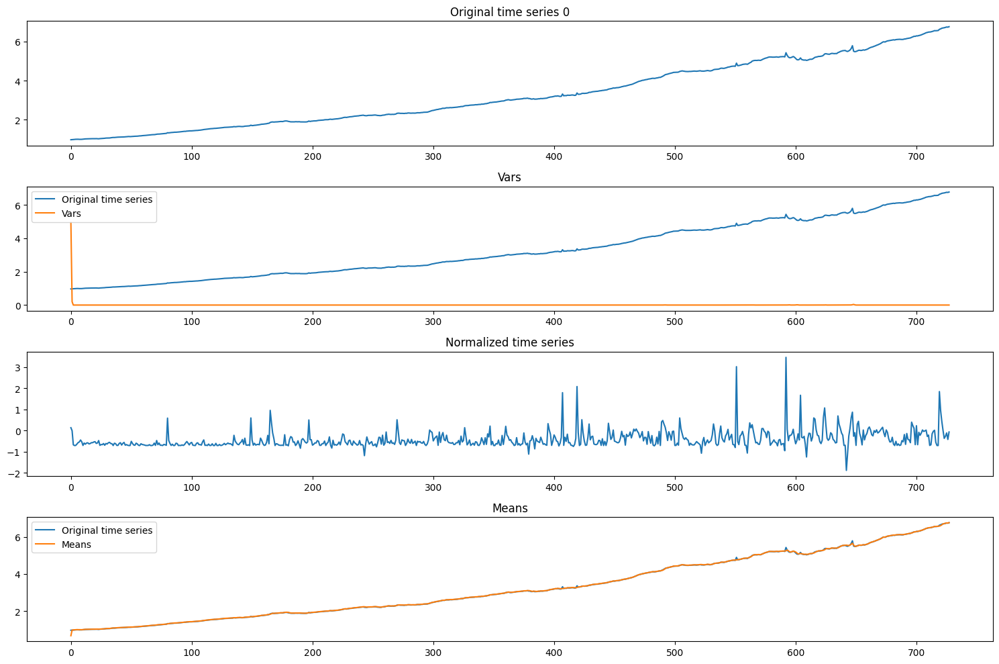

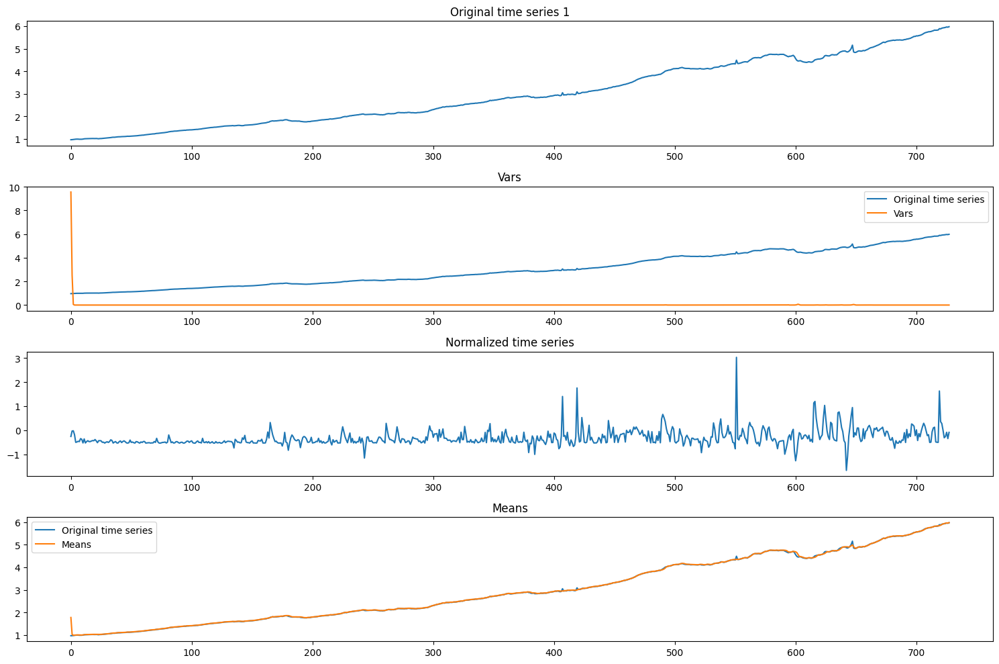

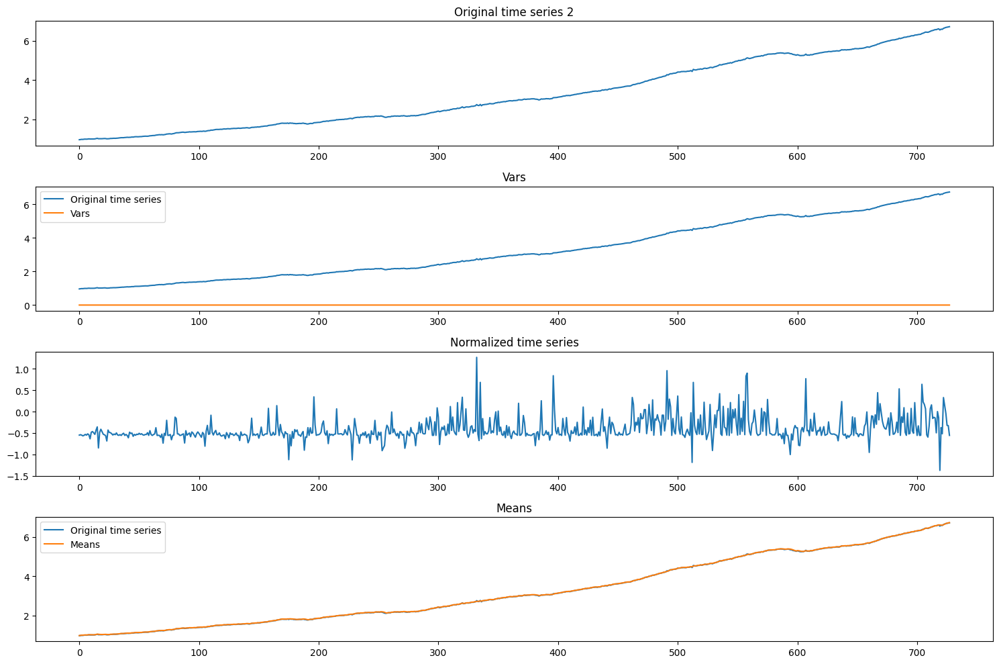

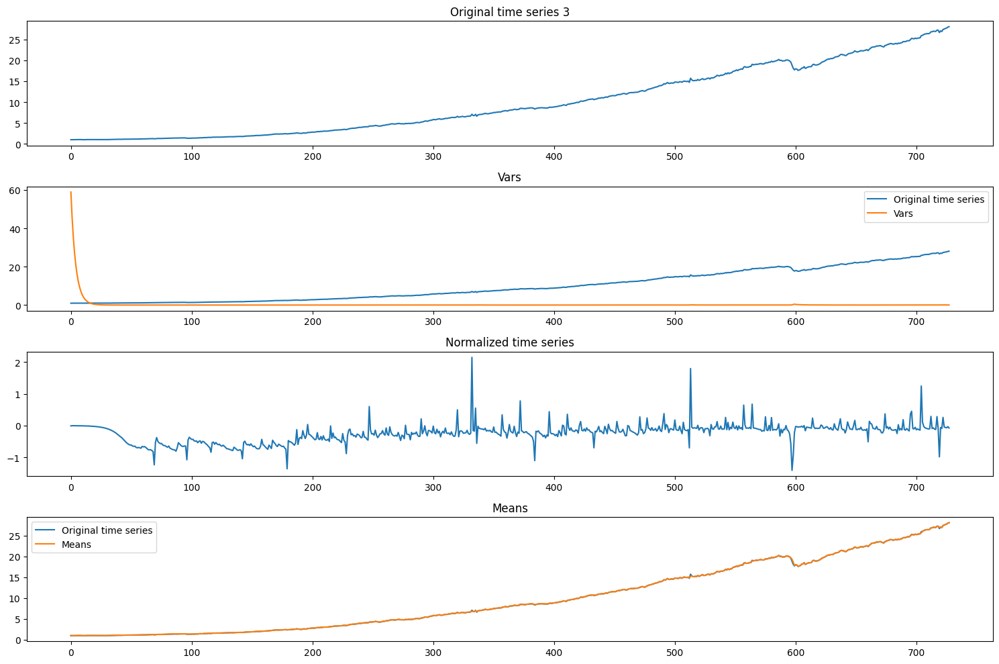

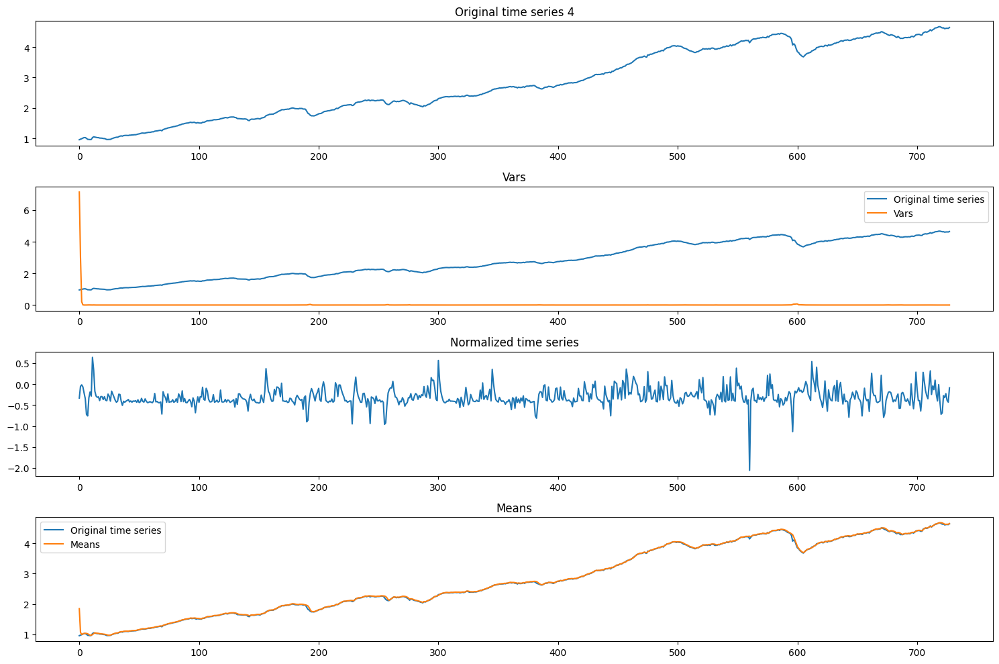

...

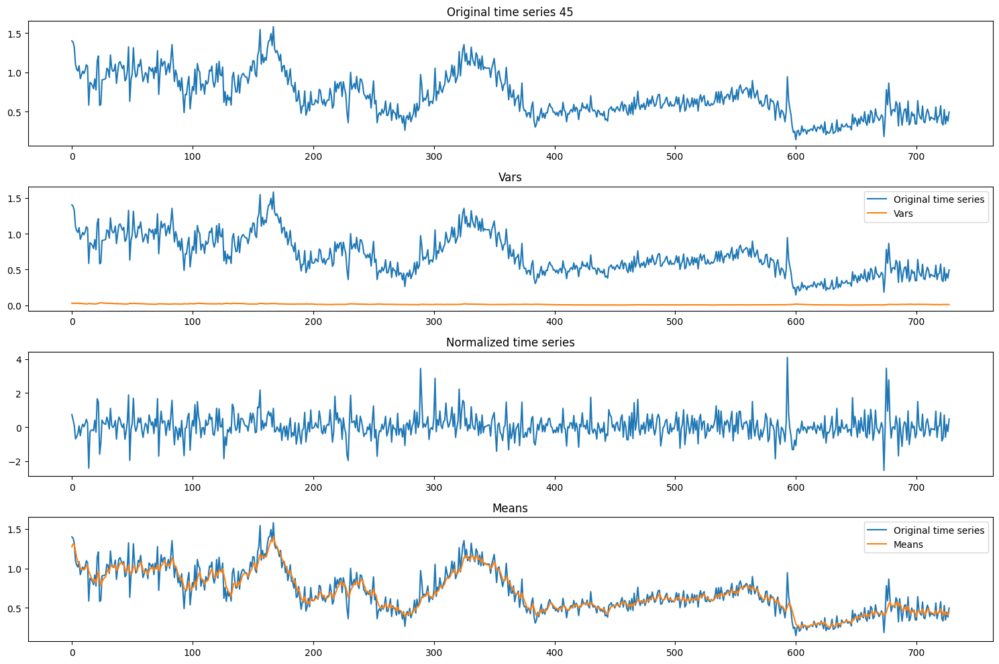

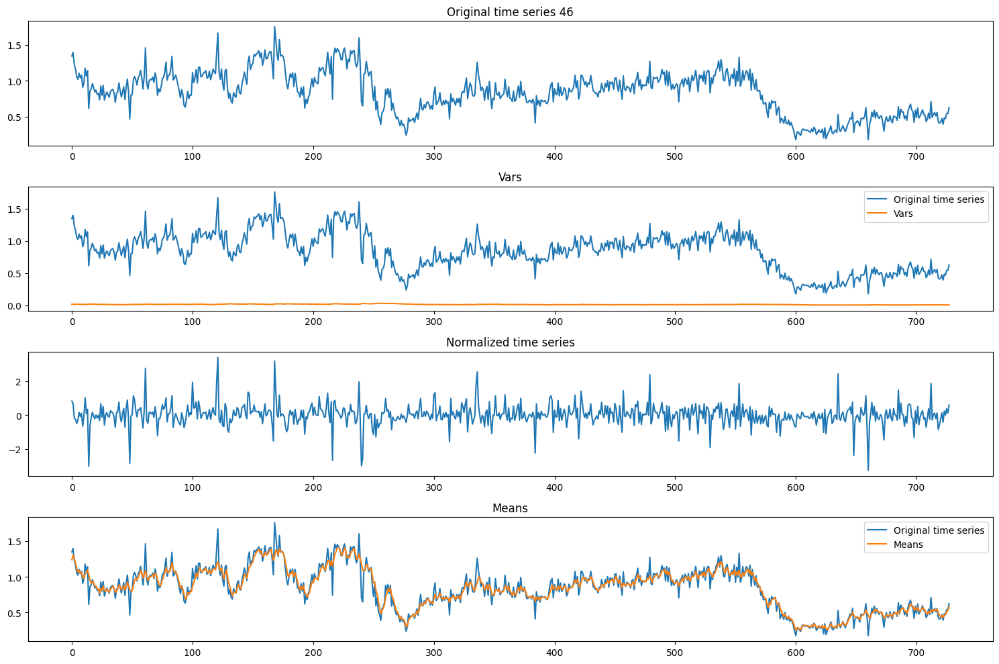

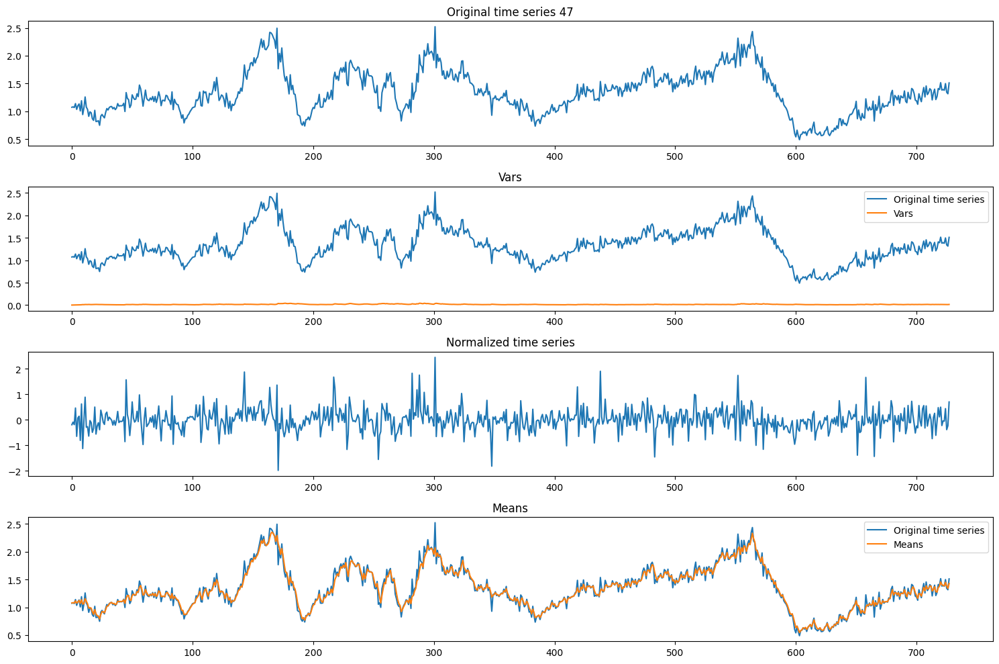

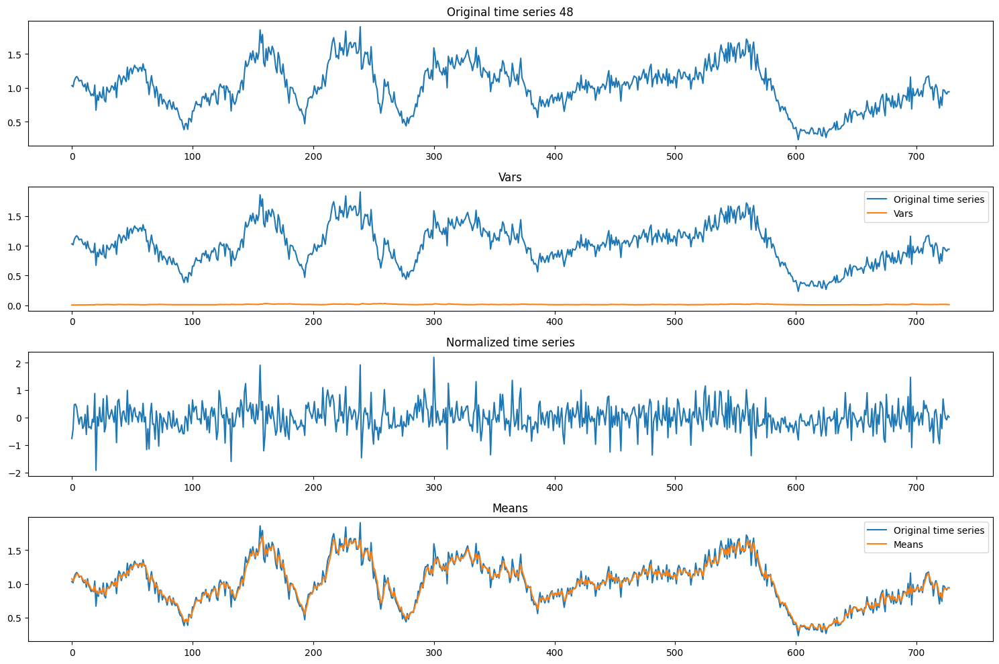

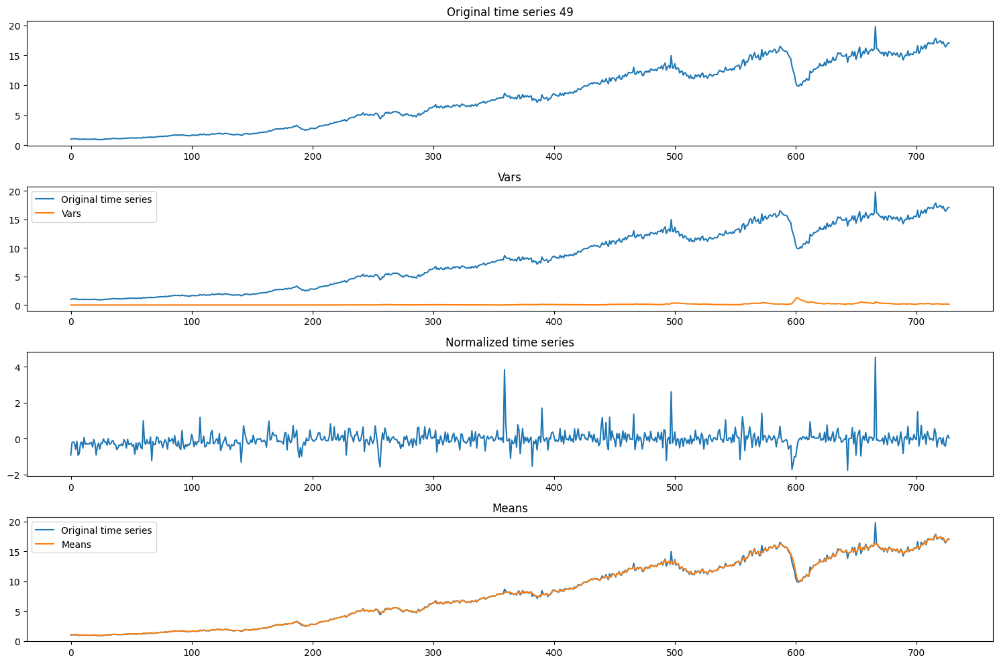

In [56]:
for ts_index in range(min(50, len(test_dataset))):

    # create a subfigure with 5 plots in each: 
    # - the original time series, 
    # - the normalized time series, 
    # - the original time series with its means,
    # - the original time series with its vars,
    # - the original time series with the predictions
    ts = test_dataset[ts_index]["target"]
    means = test_means[ts_index]
    vars = test_vars[ts_index]
    norm_ts = test_norm_ts[ts_index]

    fig, axs = plt.subplots(4, 1, figsize=(15, 10))
    axs[0].plot(ts)
    axs[0].set_title(f'Original time series {ts_index}')

    axs[1].plot(ts)
    axs[1].plot(vars)
    axs[1].set_title('Vars')
    axs[1].legend(['Original time series', 'Vars'])

    axs[2].plot(norm_ts)
    axs[2].set_title('Normalized time series')

    axs[3].plot(ts)
    axs[3].plot(means)
    axs[3].set_title('Means')
    axs[3].legend(['Original time series', 'Means'])

    plt.tight_layout()
    plt.show()

Load the DL model

In [57]:
import pickle

dl_folder = os.path.join(ROOT_FOLDER, "dl_model")

with open(os.path.join(dl_folder, "dl_model.pkl"), "rb") as f:
    predictor = pickle.load(f)

In [58]:
from gluonts.evaluation import make_evaluation_predictions

forecast_it, ts_it = make_evaluation_predictions(
    dataset=test_dataset,  # test dataset
    predictor=predictor,  # predictor
    num_samples=100,  # number of sample paths we want for evaluation
)

forecasts = list(forecast_it)
tss = list(ts_it)

In [59]:
import json
from gluonts.evaluation import Evaluator

evaluator = Evaluator(quantiles=[0.1, 0.5, 0.9])
agg_metrics, item_metrics = evaluator(tss, forecasts)

print(json.dumps(agg_metrics, indent=4))

Running evaluation: 0it [00:00, ?it/s]

Running evaluation: 107it [00:00, 579.28it/s]


{
    "MSE": 5.323063852863149,
    "abs_error": 1099.8262176513672,
    "abs_target_sum": 14529.476307153702,
    "abs_target_mean": 11.315791516474844,
    "seasonal_error": 0.4518549102172572,
    "MASE": 5.110653346781587,
    "MAPE": 0.5792093606023748,
    "sMAPE": 0.27082625388333176,
    "MSIS": 60.21162155279153,
    "QuantileLoss[0.1]": 703.511764858663,
    "Coverage[0.1]": 0.05529595015576323,
    "QuantileLoss[0.5]": 1099.8262062072754,
    "Coverage[0.5]": 0.8348909657320873,
    "QuantileLoss[0.9]": 748.6240641117096,
    "Coverage[0.9]": 0.9727414330218068,
    "RMSE": 2.3071765976758583,
    "NRMSE": 0.20388998810351025,
    "ND": 0.07569620503870873,
    "wQuantileLoss[0.1]": 0.04841962297789656,
    "wQuantileLoss[0.5]": 0.07569620425106219,
    "wQuantileLoss[0.9]": 0.05152450427570598,
    "mean_absolute_QuantileLoss": 850.6540117258827,
    "mean_wQuantileLoss": 0.05854677716822158,
    "MAE_Coverage": 0.4727414330218069,
    "OWA": NaN
}


In [60]:
item_metrics.head()

,item_id,forecast_start,MSE,abs_error,abs_target_sum,abs_target_mean,seasonal_error,MASE,MAPE,sMAPE,ND,MSIS,QuantileLoss[0.1],Coverage[0.1],QuantileLoss[0.5],Coverage[0.5],QuantileLoss[0.9],Coverage[0.9]
0,None,2018-09,0.056413,1.733194,80.043327,6.670277,0.101081,1.428879,0.021811,0.021360,0.021653,37.038567,1.643002,0.0,1.733194,0.833333,2.202011,1.0
1,None,2018-09,0.057582,2.163226,70.836349,5.903029,0.097346,1.851830,0.030651,0.029819,0.030538,34.408976,1.483659,0.0,2.163226,0.916667,2.392685,1.0
2,None,2018-09,0.046693,1.952651,79.624573,6.635381,0.098141,1.658028,0.024533,0.024076,0.024523,34.399404,1.453135,0.0,1.952651,0.833333,2.042713,1.0
3,None,2018-09,0.192348,4.641750,328.391266,27.365939,0.505327,0.765470,0.014054,0.014123,0.014135,15.345830,5.030002,0.0,4.641750,0.333333,4.029928,1.0
4,None,2018-09,0.154370,3.294143,55.636051,4.636338,0.112360,2.443146,0.059124,0.056680,0.059209,35.751077,1.235025,0.0,3.294143,1.000000,2.430506,1.0


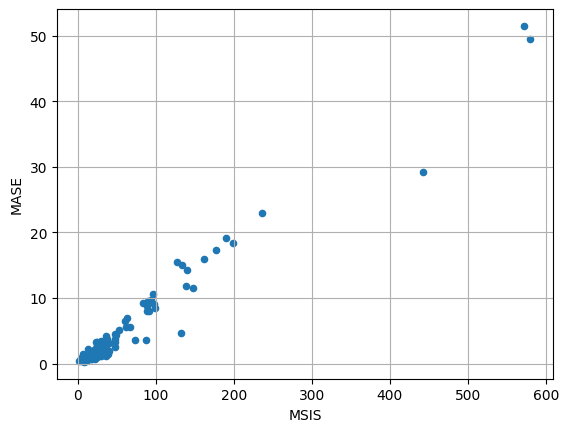

In [61]:
import matplotlib.pyplot as plt

item_metrics.plot(x="MSIS", y="MASE", kind="scatter")
plt.grid(which="both")
plt.show()

Number of sample paths: 100
Dimension of samples: (100, 12)
Start date of the forecast window: 2018-09
Frequency of the time series: <MonthEnd>
Mean of the future window:
 [6.228718  7.195981  6.847211  6.824027  6.7031727 6.5996656 6.769904
 6.8417983 6.7405934 6.8329835 6.793869  6.8655567]
0.5-quantile (median) of the future window:
 [6.645899  7.018219  7.029665  6.8079515 6.677587  6.5727787 6.701029
 6.773319  6.690182  6.843643  6.8233857 6.8947215]


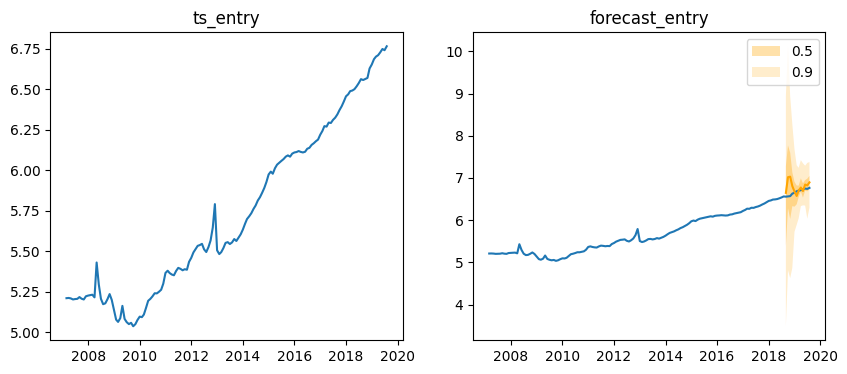

Number of sample paths: 100
Dimension of samples: (100, 12)
Start date of the forecast window: 2018-09
Frequency of the time series: <MonthEnd>
Mean of the future window:
 [6.154868  5.752115  6.4858565 6.064756  6.0156612 5.8404403 5.9741116
 5.959261  6.050866  6.0639553 6.1389327 6.1444354]
0.5-quantile (median) of the future window:
 [5.9404073 6.050868  6.5284076 6.103998  5.95607   5.8360453 5.9439225
 6.0539675 6.0462413 6.088556  6.123545  6.1812086]


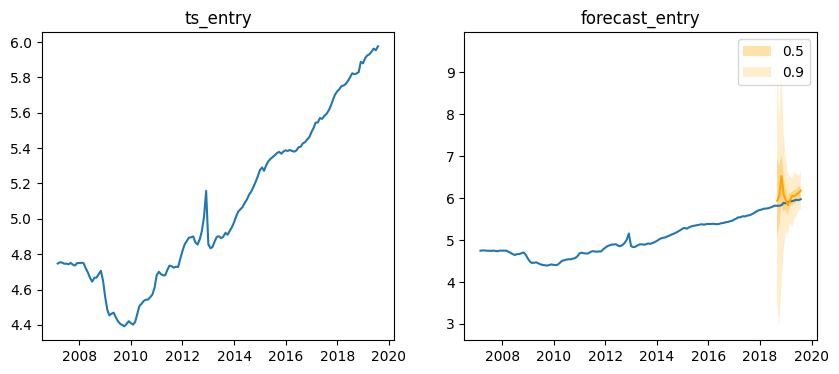

Number of sample paths: 100
Dimension of samples: (100, 12)
Start date of the forecast window: 2018-09
Frequency of the time series: <MonthEnd>
Mean of the future window:
 [6.3638954 6.723903  7.1662197 6.788161  6.7275367 6.519975  6.621744
 6.774235  6.8666353 6.84023   6.860659  6.892313 ]
0.5-quantile (median) of the future window:
 [6.6729293 6.7461557 7.1254206 6.798526  6.737673  6.5493784 6.627703
 6.7631416 6.839871  6.8550878 6.858449  6.9145417]


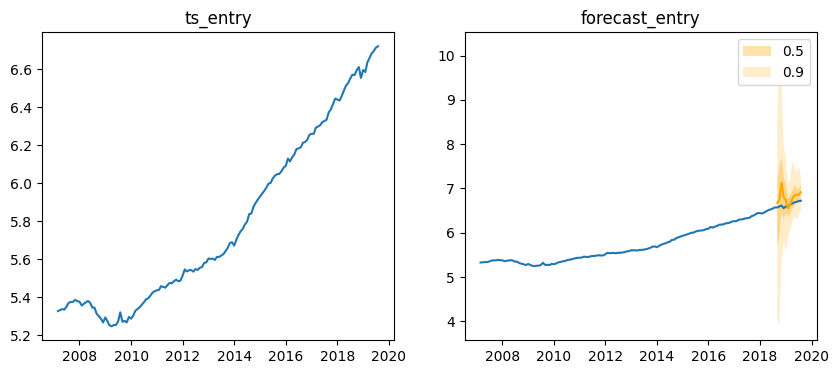

Number of sample paths: 100
Dimension of samples: (100, 12)
Start date of the forecast window: 2018-09
Frequency of the time series: <MonthEnd>
Mean of the future window:
 [26.702469 27.367647 27.380861 26.70664  27.26047  27.209047 27.055536
 26.981356 27.272602 27.243736 27.489708 27.03548 ]
0.5-quantile (median) of the future window:
 [26.580738 27.199951 27.817333 26.813328 27.34506  27.297356 27.273516
 27.13083  27.232761 27.384804 27.343447 27.122284]


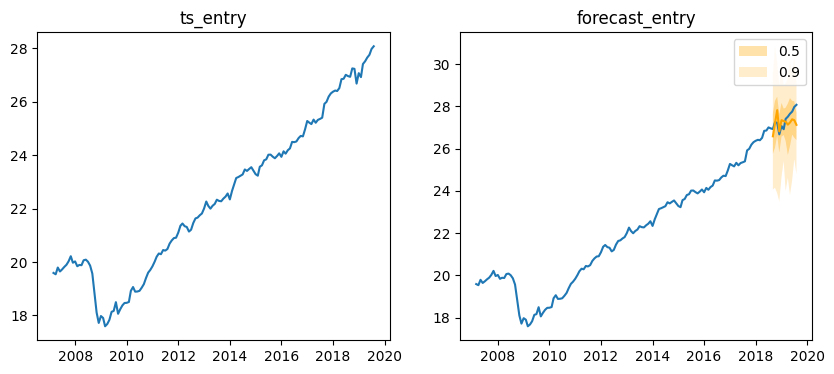

Number of sample paths: 100
Dimension of samples: (100, 12)
Start date of the forecast window: 2018-09
Frequency of the time series: <MonthEnd>
Mean of the future window:
 [4.8479047 5.5966015 5.4015374 4.824798  4.828599  4.728187  4.7792935
 4.852664  4.8857913 4.8095593 4.8291035 4.8944   ]
0.5-quantile (median) of the future window:
 [4.655667  5.3150907 5.341249  4.983637  4.847165  4.7630424 4.780345
 4.827492  4.86913   4.832476  4.8252025 4.889697 ]


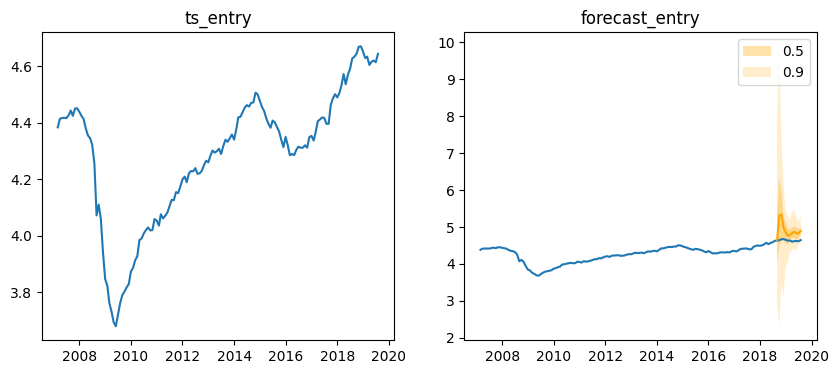

Number of sample paths: 100
Dimension of samples: (100, 12)
Start date of the forecast window: 2018-09
Frequency of the time series: <MonthEnd>
Mean of the future window:
 [5.0985785 4.7141547 5.478356  4.6164384 4.7185717 4.4340787 4.459385
 4.439917  4.4246545 4.3942757 4.3825874 4.4004235]
0.5-quantile (median) of the future window:
 [4.666168  4.741851  5.3185225 4.5750813 4.6364484 4.42105   4.4354496
 4.421478  4.4502945 4.421547  4.38485   4.4136195]


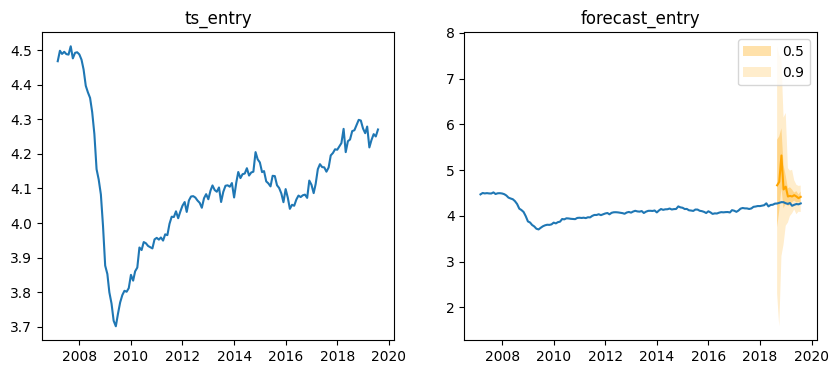

Number of sample paths: 100
Dimension of samples: (100, 12)
Start date of the forecast window: 2018-09
Frequency of the time series: <MonthEnd>
Mean of the future window:
 [4.4990835 4.7952495 5.03664   4.8892174 4.6199727 4.637735  4.666752
 4.6094646 4.6523843 4.602702  4.517513  4.6341066]
0.5-quantile (median) of the future window:
 [4.4335895 5.084167  5.180068  4.90862   4.661528  4.645356  4.628515
 4.6044197 4.6423874 4.607224  4.600283  4.647394 ]


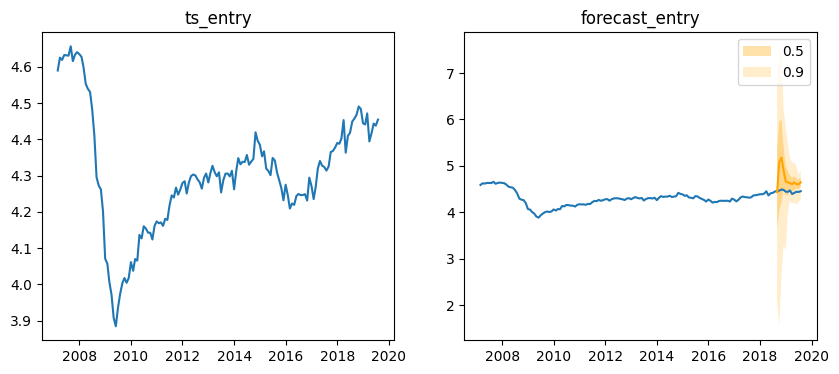

Number of sample paths: 100
Dimension of samples: (100, 12)
Start date of the forecast window: 2018-09
Frequency of the time series: <MonthEnd>
Mean of the future window:
 [3.7525547 4.2059464 3.8574033 3.7438576 3.69982   3.2729363 3.319025
 3.258082  3.334794  3.2781255 3.2000952 3.3081677]
0.5-quantile (median) of the future window:
 [3.730414  4.0771303 3.8450074 3.787611  3.599128  3.288001  3.3463135
 3.2617414 3.265936  3.31153   3.2130136 3.3223386]


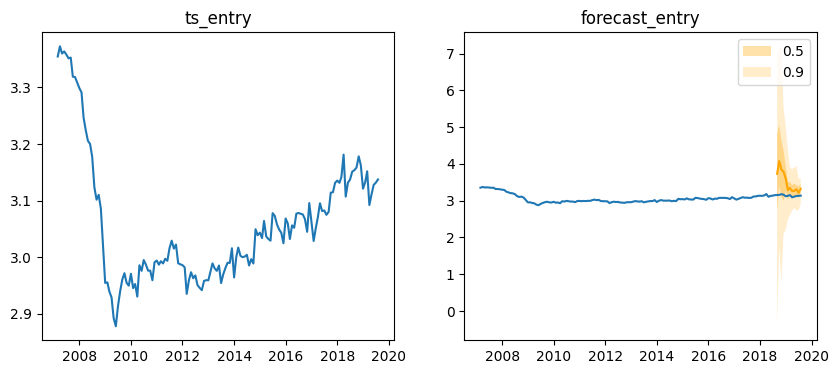

Number of sample paths: 100
Dimension of samples: (100, 12)
Start date of the forecast window: 2018-09
Frequency of the time series: <MonthEnd>
Mean of the future window:
 [5.0620327 5.7936077 5.655373  5.5758324 5.4698577 5.367815  5.392807
 5.5062976 5.460288  5.5324597 5.444693  5.5691614]
0.5-quantile (median) of the future window:
 [5.3259325 5.827309  5.702476  5.5902762 5.5101666 5.3534913 5.4512672
 5.4950504 5.467705  5.480494  5.457253  5.599572 ]


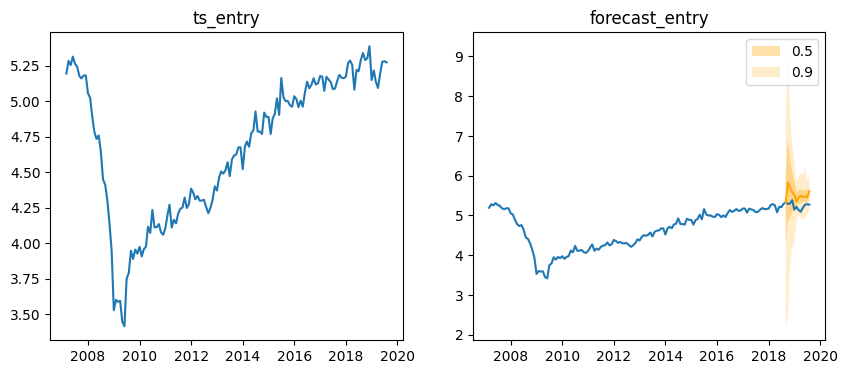

Number of sample paths: 100
Dimension of samples: (100, 12)
Start date of the forecast window: 2018-09
Frequency of the time series: <MonthEnd>
Mean of the future window:
 [3.188169  3.5043628 3.4937468 3.294622  3.102329  2.8308735 2.8230512
 2.760532  2.6531544 2.7040534 2.5942893 2.733394 ]
0.5-quantile (median) of the future window:
 [3.0629783 3.4761996 3.5793633 3.2441182 3.067047  2.7859392 2.788296
 2.7502394 2.6838627 2.6505075 2.6221745 2.7454665]


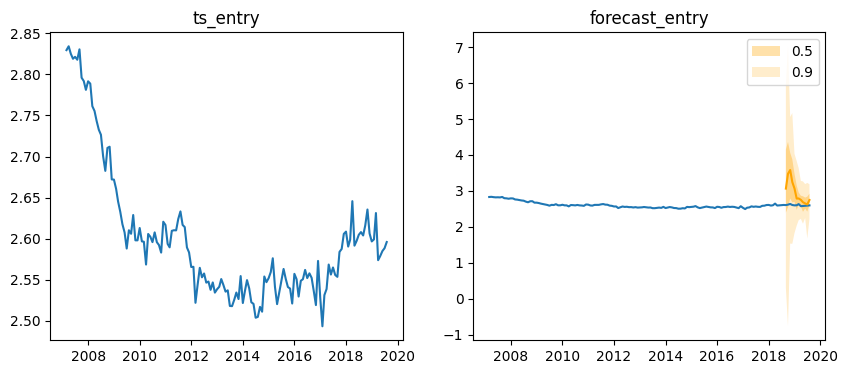

Number of sample paths: 100
Dimension of samples: (100, 12)
Start date of the forecast window: 2018-09
Frequency of the time series: <MonthEnd>
Mean of the future window:
 [11.609876 11.742246 12.048223 11.91719  11.831806 11.560003 11.668909
 11.647583 12.017406 12.06293  12.143881 12.259435]
0.5-quantile (median) of the future window:
 [11.474966 11.664798 12.150244 11.832775 11.809141 11.617665 11.659674
 11.787354 11.8722   12.129179 12.182772 12.175845]


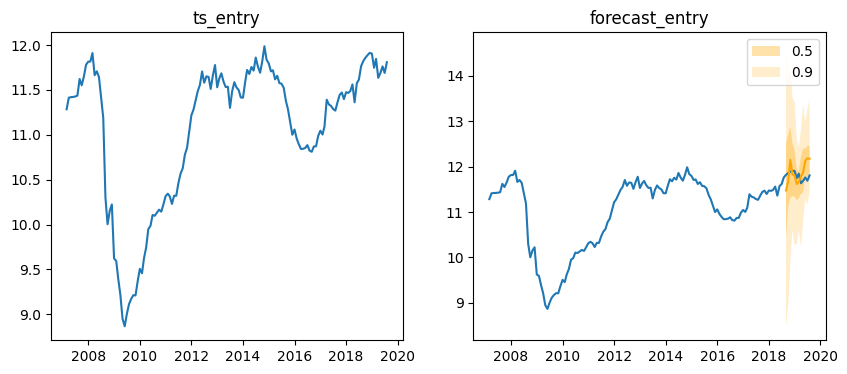

Number of sample paths: 100
Dimension of samples: (100, 12)
Start date of the forecast window: 2018-09
Frequency of the time series: <MonthEnd>
Mean of the future window:
 [5.372901  5.6641903 6.0857325 5.4607935 5.401084  5.325995  5.3509517
 5.4476013 5.3869677 5.4054236 5.368027  5.43211  ]
0.5-quantile (median) of the future window:
 [5.434037  5.7600174 6.156315  5.594114  5.38262   5.2954483 5.3416276
 5.416844  5.4081593 5.3923016 5.3486037 5.4211364]


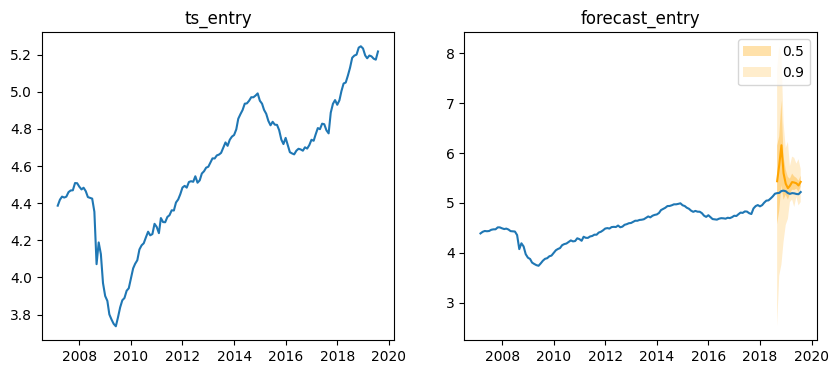

Number of sample paths: 100
Dimension of samples: (100, 12)
Start date of the forecast window: 2018-09
Frequency of the time series: <MonthEnd>
Mean of the future window:
 [8.004571 8.414306 8.649265 8.393277 8.287412 8.215047 8.279507 8.399836
 8.630976 8.624938 8.67284  8.672382]
0.5-quantile (median) of the future window:
 [8.158406 8.590714 8.791868 8.370584 8.309004 8.224632 8.247625 8.391528
 8.555446 8.616417 8.684198 8.648775]


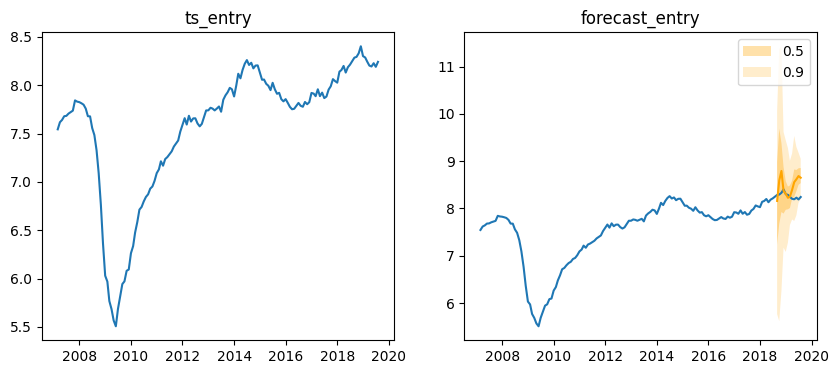

Number of sample paths: 100
Dimension of samples: (100, 12)
Start date of the forecast window: 2018-09
Frequency of the time series: <MonthEnd>
Mean of the future window:
 [3.4085407 3.561931  4.679345  4.0076246 3.5436432 3.1997786 3.243385
 3.37136   3.2782273 3.3521383 3.2490532 3.3584003]
0.5-quantile (median) of the future window:
 [3.5226889 3.8100564 4.491748  3.8353317 3.4687138 3.3238027 3.2627487
 3.3059573 3.330909  3.3077826 3.2622645 3.3674083]


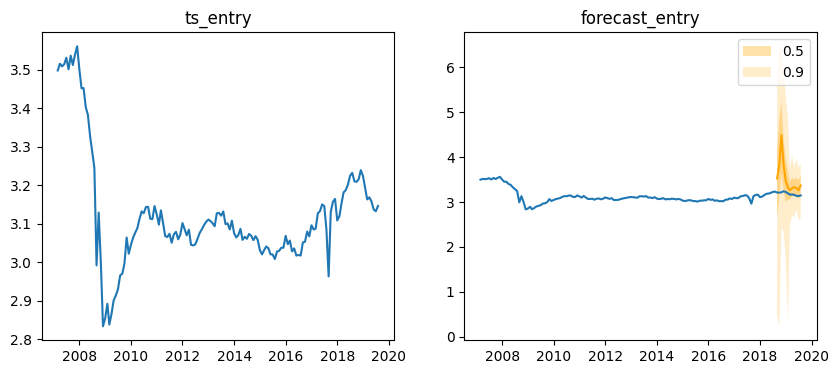

Number of sample paths: 100
Dimension of samples: (100, 12)
Start date of the forecast window: 2018-09
Frequency of the time series: <MonthEnd>
Mean of the future window:
 [5.4043884 5.0158706 5.181287  5.2422743 5.106261  4.8401833 4.9464946
 5.044272  4.9388723 4.946054  4.922385  5.0218678]
0.5-quantile (median) of the future window:
 [5.1386385 5.141822  5.3503575 5.3331656 5.0548754 4.836961  4.954834
 5.0333967 4.9496946 4.948647  4.9442396 5.00718  ]


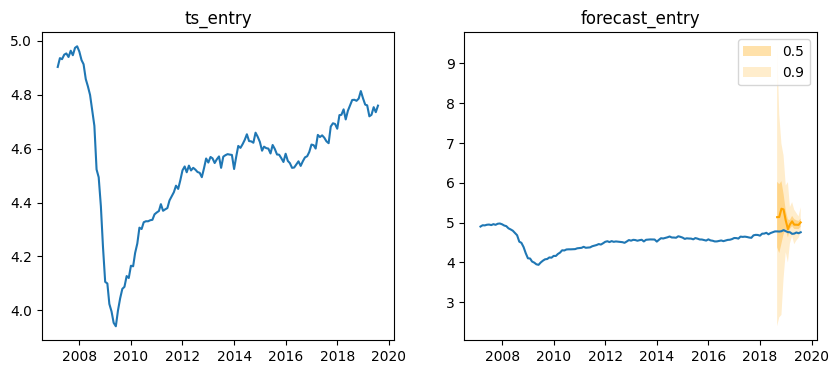

Number of sample paths: 100
Dimension of samples: (100, 12)
Start date of the forecast window: 2018-09
Frequency of the time series: <MonthEnd>
Mean of the future window:
 [5.1521583 5.335399  5.7843003 5.3365874 5.056242  4.939748  5.0275087
 5.1170983 5.076704  5.0418587 5.0606165 5.071387 ]
0.5-quantile (median) of the future window:
 [5.0407753 5.396917  5.5035257 5.2130814 5.1387286 4.9666824 5.050195
 5.1163607 5.085478  5.062658  5.0630107 5.132995 ]


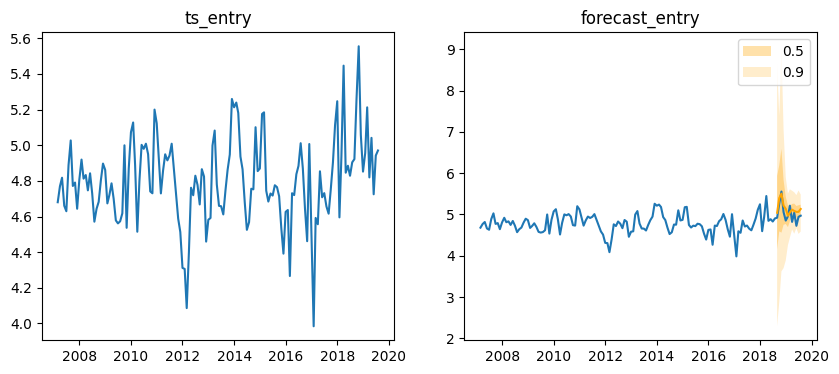

Number of sample paths: 100
Dimension of samples: (100, 12)
Start date of the forecast window: 2018-09
Frequency of the time series: <MonthEnd>
Mean of the future window:
 [3.6703613 3.9234967 3.8113928 3.524276  3.3880298 3.069264  3.0224817
 3.0308585 2.961754  3.0298378 2.9960973 3.0959558]
0.5-quantile (median) of the future window:
 [3.470354  4.056815  3.7951047 3.612886  3.3793054 3.0218322 2.9915776
 3.0018456 2.9626603 3.0232143 2.9701512 3.1174433]


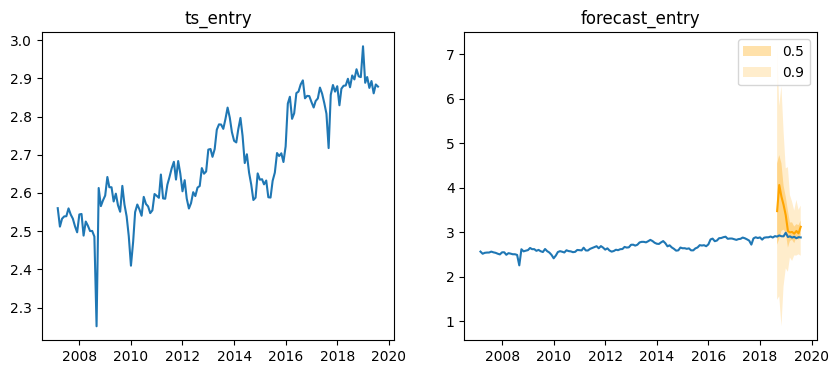

Number of sample paths: 100
Dimension of samples: (100, 12)
Start date of the forecast window: 2018-09
Frequency of the time series: <MonthEnd>
Mean of the future window:
 [1.7791486 2.00012   1.9062053 2.320508  2.667307  1.5211868 1.675643
 1.1229616 1.2081321 1.25031   1.2006345 1.3645034]
0.5-quantile (median) of the future window:
 [1.804633  2.03305   2.4040356 1.8203161 1.7199808 1.4231424 1.2473686
 1.1458468 1.1669567 1.2161968 1.1959338 1.3666865]


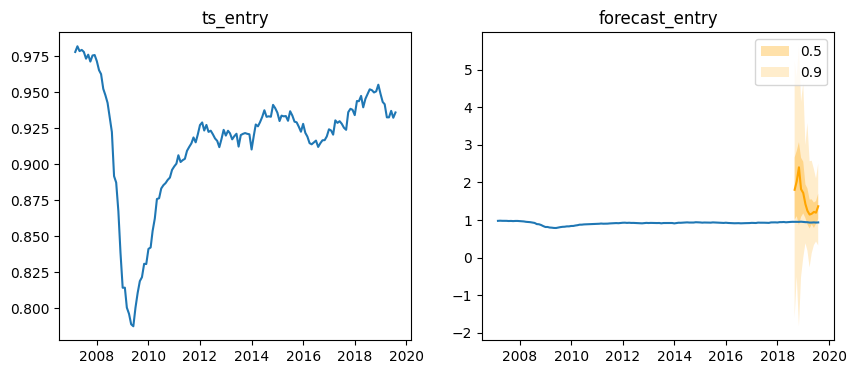

Number of sample paths: 100
Dimension of samples: (100, 12)
Start date of the forecast window: 2018-09
Frequency of the time series: <MonthEnd>
Mean of the future window:
 [2.74048   3.4377518 3.4116976 3.248741  3.014669  2.6684    2.482369
 2.4622202 2.504006  2.4088151 2.4355803 2.4583213]
0.5-quantile (median) of the future window:
 [2.7168565 3.62278   3.2716353 3.1008584 2.8470285 2.6367016 2.4746778
 2.487489  2.486988  2.397109  2.3922033 2.4229467]


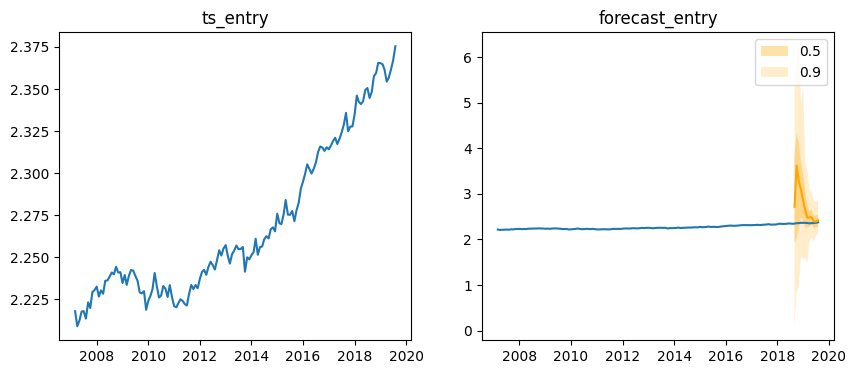

Number of sample paths: 100
Dimension of samples: (100, 12)
Start date of the forecast window: 2018-09
Frequency of the time series: <MonthEnd>
Mean of the future window:
 [2.3049853 3.3780906 3.5826375 3.0558233 2.662793  2.7212577 2.5861075
 2.6351123 2.4979568 2.4924502 2.3938646 2.444822 ]
0.5-quantile (median) of the future window:
 [2.7304156 3.313496  3.4743013 3.0832949 2.8422368 2.6507487 2.5444145
 2.5190506 2.4917011 2.469302  2.413026  2.4558165]


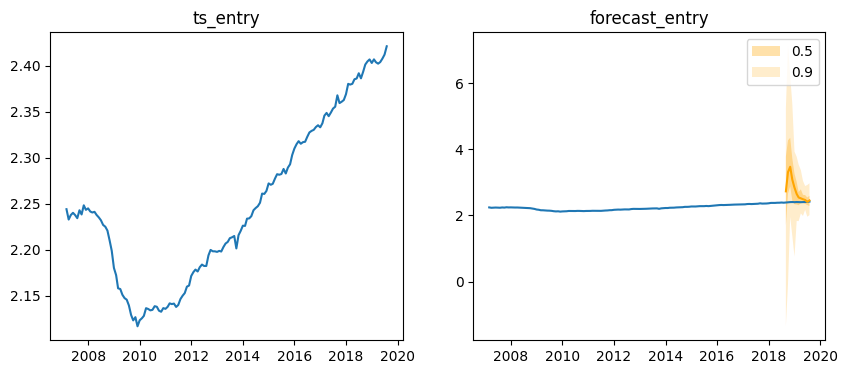

Number of sample paths: 100
Dimension of samples: (100, 12)
Start date of the forecast window: 2018-09
Frequency of the time series: <MonthEnd>
Mean of the future window:
 [1.3828702  0.9309639  1.4295529  1.2602242  1.4840534  0.61294156
 0.57403004 0.5370916  0.374645   0.4164544  0.48102406 0.5582312 ]
0.5-quantile (median) of the future window:
 [1.2408999  1.1095568  1.4310355  1.2600175  1.0120175  0.6157123
 0.42522326 0.37991118 0.2630828  0.3727301  0.47639292 0.52905667]


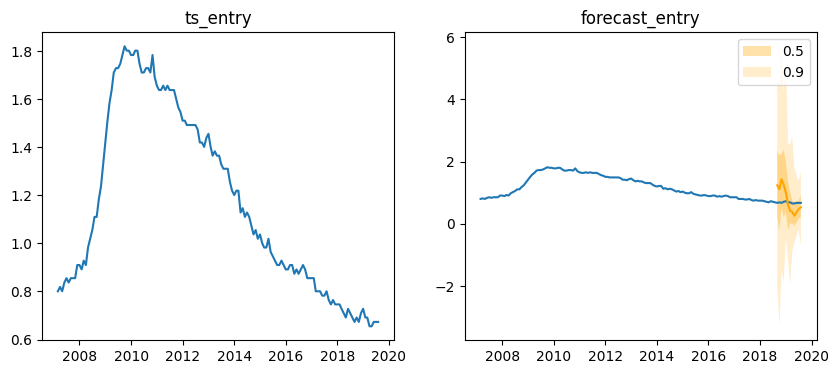

Number of sample paths: 100
Dimension of samples: (100, 12)
Start date of the forecast window: 2018-09
Frequency of the time series: <MonthEnd>
Mean of the future window:
 [2.4177287 2.5510948 2.7686572 2.3038962 2.1633408 1.745679  1.942695
 1.7459146 1.6704817 1.7141623 1.8102167 1.7099314]
0.5-quantile (median) of the future window:
 [2.4294505 2.1495082 2.693601  2.1905527 2.1707125 1.8643073 1.858245
 1.6922507 1.7107086 1.6754801 1.7419426 1.7723671]


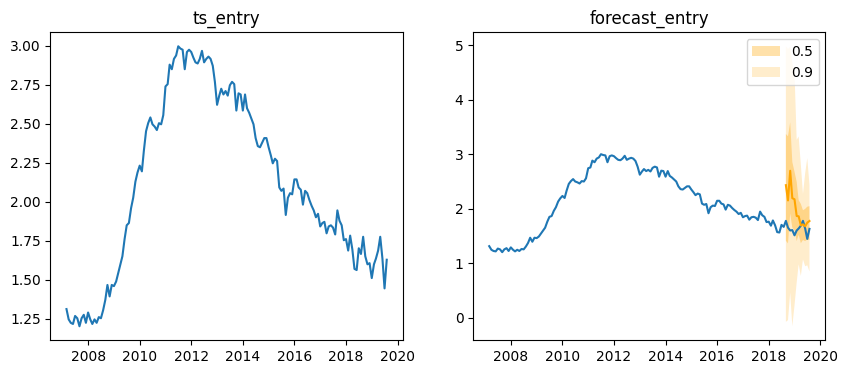

Number of sample paths: 100
Dimension of samples: (100, 12)
Start date of the forecast window: 2018-09
Frequency of the time series: <MonthEnd>
Mean of the future window:
 [1.4240923 2.1110823 2.3382282 1.9373208 2.3189948 1.6551417 1.6364088
 1.3850609 1.7142781 1.502077  1.4932103 1.6354039]
0.5-quantile (median) of the future window:
 [1.9637177 2.4464176 2.3469207 2.0368693 1.9967889 1.486172  1.6492367
 1.4750272 1.5883377 1.4379907 1.5108998 1.5853968]


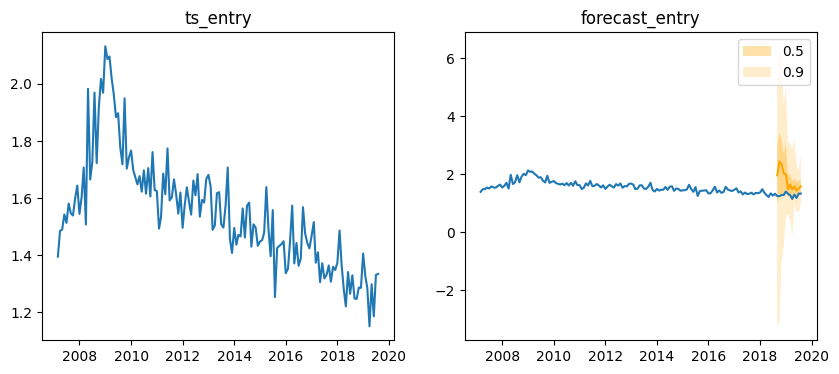

Number of sample paths: 100
Dimension of samples: (100, 12)
Start date of the forecast window: 2018-09
Frequency of the time series: <MonthEnd>
Mean of the future window:
 [2.2668657 2.205155  3.0232935 2.177282  2.1525655 1.8180227 1.7167563
 1.6811342 1.7052039 1.6026981 1.6015452 1.5358446]
0.5-quantile (median) of the future window:
 [2.3118312 2.22537   2.5686495 2.2615159 2.2057211 1.874072  1.7655319
 1.6229713 1.6642001 1.6159452 1.626916  1.6195347]


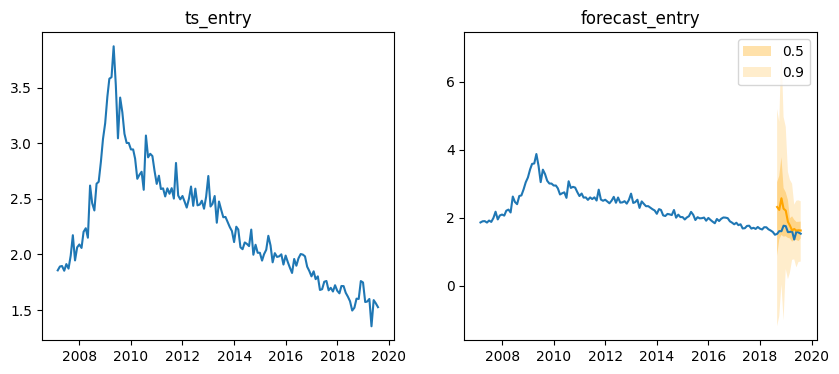

Number of sample paths: 100
Dimension of samples: (100, 12)
Start date of the forecast window: 2018-09
Frequency of the time series: <MonthEnd>
Mean of the future window:
 [2.3659332 3.0533912 2.661328  2.4914854 2.699125  2.289821  2.0398364
 1.9960306 2.2104304 1.9687961 2.0662477 2.1109624]
0.5-quantile (median) of the future window:
 [2.3996937 2.8899863 2.8242702 2.4791377 2.502957  2.2463207 2.0077477
 2.0098097 2.0426075 1.9275494 2.0515294 2.010672 ]


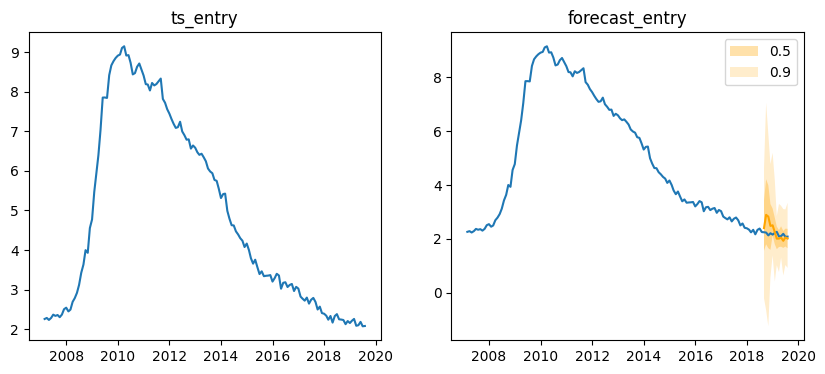

Number of sample paths: 100
Dimension of samples: (100, 12)
Start date of the forecast window: 2018-09
Frequency of the time series: <MonthEnd>
Mean of the future window:
 [2.399686  2.6257672 2.7748585 2.2056735 2.2837548 2.1589975 1.9090343
 1.9987787 1.8706231 1.8974445 1.8698889 1.9308618]
0.5-quantile (median) of the future window:
 [2.2125597 2.3702338 2.6012924 2.4211981 2.1557682 2.10787   1.925157
 1.8485861 1.8631188 1.909758  1.7630699 1.9167105]


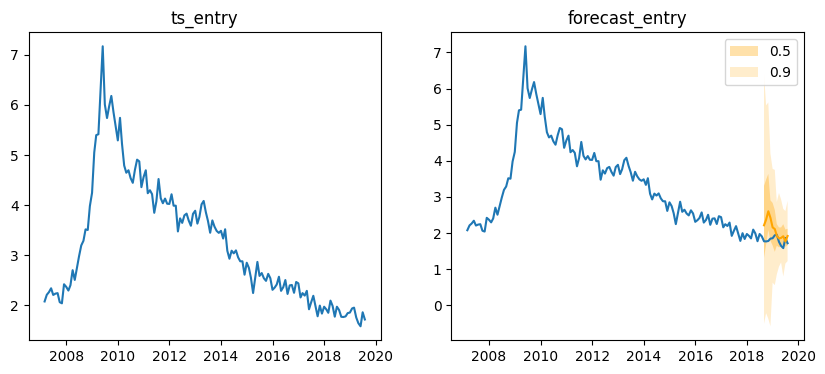

Number of sample paths: 100
Dimension of samples: (100, 12)
Start date of the forecast window: 2018-09
Frequency of the time series: <MonthEnd>
Mean of the future window:
 [2.5607777 2.7238772 3.0467703 2.7527175 2.8879602 2.296574  2.2880986
 2.1939929 2.1860206 2.090695  2.1640692 2.1964927]
0.5-quantile (median) of the future window:
 [2.5218022 2.6756034 2.9635258 2.717718  2.703145  2.4135044 2.195302
 2.1864367 2.0862315 2.1423805 2.0556252 2.1892207]


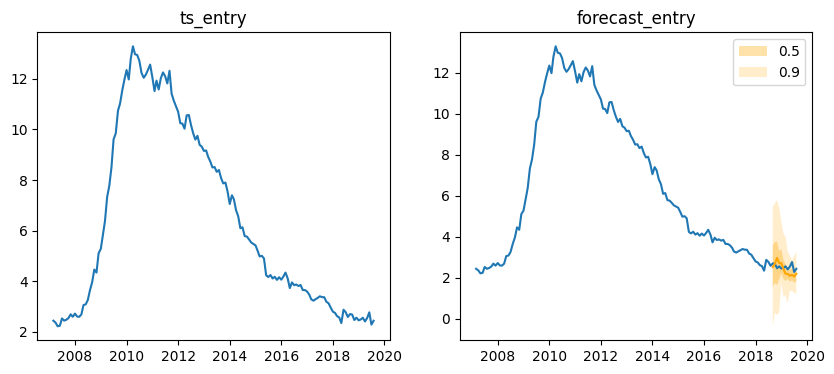

Number of sample paths: 100
Dimension of samples: (100, 12)
Start date of the forecast window: 2018-09
Frequency of the time series: <MonthEnd>
Mean of the future window:
 [1.5036796  1.981298   1.83124    1.870659   1.675813   1.3344339
 1.0490079  0.76349086 0.938403   0.9730961  1.0474877  1.1520946 ]
0.5-quantile (median) of the future window:
 [1.5623795  1.7791033  2.2512422  1.9407244  1.4906814  1.1749966
 0.93119264 1.0349584  0.8809823  0.95960444 1.0144626  1.0689985 ]


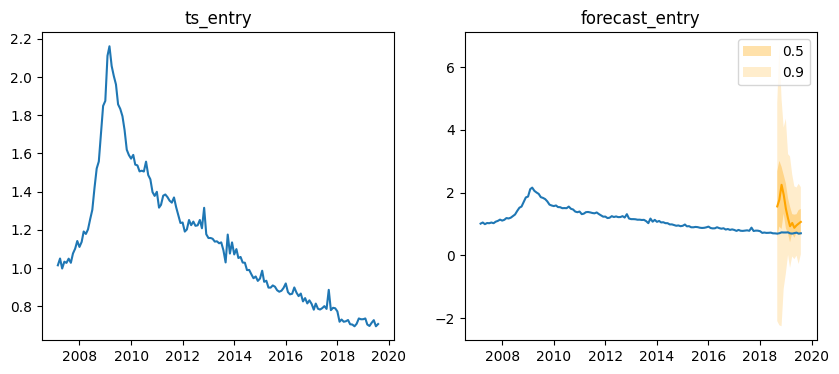

Number of sample paths: 100
Dimension of samples: (100, 12)
Start date of the forecast window: 2018-09
Frequency of the time series: <MonthEnd>
Mean of the future window:
 [3.5053234 3.6324449 3.9526534 3.455138  3.1909363 2.8534882 2.8115802
 2.902436  2.8799448 2.9294012 2.887996  2.8516674]
0.5-quantile (median) of the future window:
 [3.6590977 3.8673997 4.0323353 3.4482286 3.1208603 2.8019593 2.7989144
 2.8918717 2.893252  2.9083655 2.8680809 2.8569965]


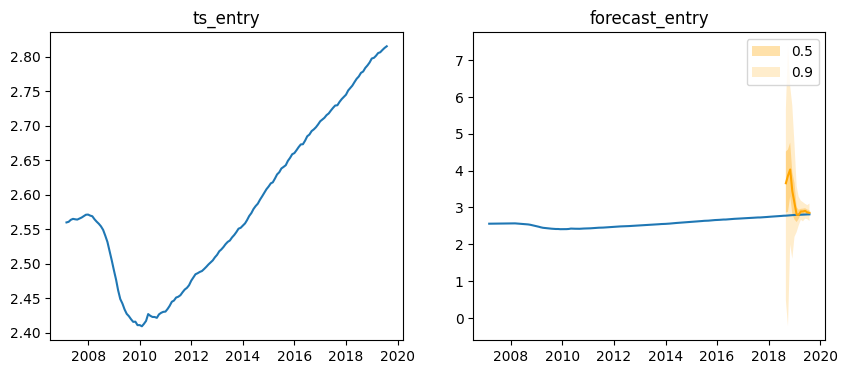

Number of sample paths: 100
Dimension of samples: (100, 12)
Start date of the forecast window: 2018-09
Frequency of the time series: <MonthEnd>
Mean of the future window:
 [2.3340025 2.5211408 2.30627   2.132092  1.7273232 1.4384917 1.2656916
 1.2558372 1.2165043 1.1511467 1.2864047 1.316446 ]
0.5-quantile (median) of the future window:
 [2.1196105 2.3623943 2.2798376 2.1049528 1.5346704 1.3566794 1.2572443
 1.2100028 1.2795038 1.2483243 1.2459755 1.2744112]


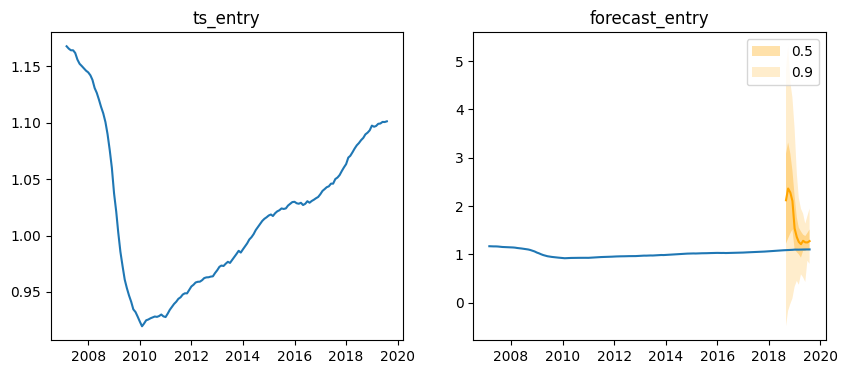

Number of sample paths: 100
Dimension of samples: (100, 12)
Start date of the forecast window: 2018-09
Frequency of the time series: <MonthEnd>
Mean of the future window:
 [1.7913766 1.9496266 1.9009721 1.9176414 1.6029207 1.3020924 1.2081015
 1.3114929 1.247615  1.3129494 1.2790065 1.434906 ]
0.5-quantile (median) of the future window:
 [2.0279815 2.2763953 2.1150484 1.897154  1.7074914 1.3286057 1.1397383
 1.215384  1.1850628 1.2842904 1.2962642 1.2520759]


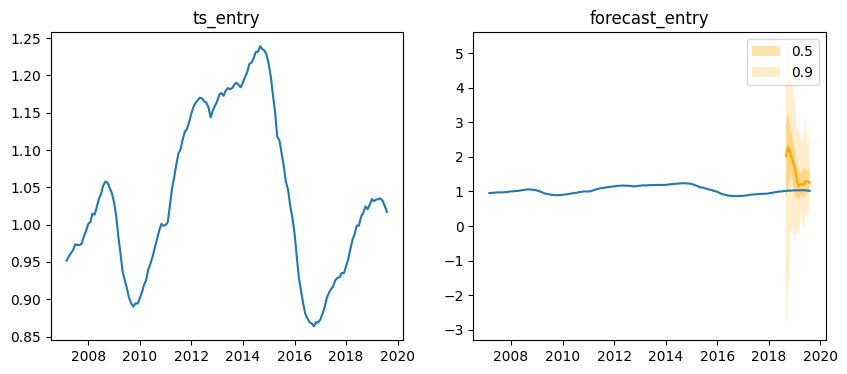

Number of sample paths: 100
Dimension of samples: (100, 12)
Start date of the forecast window: 2018-09
Frequency of the time series: <MonthEnd>
Mean of the future window:
 [3.1602619 3.3289838 3.3172717 3.2965033 2.801591  2.6189976 2.6112618
 2.594852  2.5472503 2.52491   2.5375626 2.5278428]
0.5-quantile (median) of the future window:
 [3.0396857 3.3124783 3.342696  3.387353  2.874325  2.5484028 2.5568175
 2.58745   2.5470192 2.5197468 2.5469546 2.5220633]


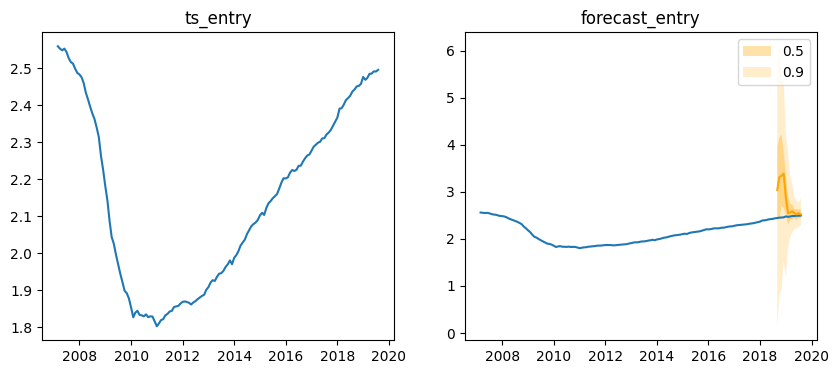

Number of sample paths: 100
Dimension of samples: (100, 12)
Start date of the forecast window: 2018-09
Frequency of the time series: <MonthEnd>
Mean of the future window:
 [1.8421177 2.362951  2.345217  1.659592  1.539758  1.3344558 1.047417
 0.9525698 1.040403  1.0638223 1.1588825 1.2267766]
0.5-quantile (median) of the future window:
 [1.8607991 2.0686276 2.0786817 1.8494146 1.5360178 1.0352839 1.023368
 0.9663227 0.9569548 1.0040509 1.1113026 1.1307614]


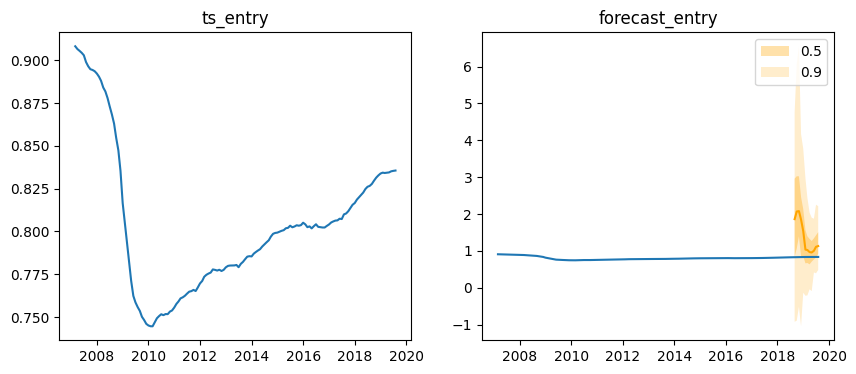

Number of sample paths: 100
Dimension of samples: (100, 12)
Start date of the forecast window: 2018-09
Frequency of the time series: <MonthEnd>
Mean of the future window:
 [1.6715846 1.9297612 2.347625  1.6048038 1.6082034 1.6138649 1.2385094
 1.0944982 1.2719024 1.159121  1.241341  1.2054292]
0.5-quantile (median) of the future window:
 [1.6170442 2.00957   2.0694044 1.7335076 1.3738161 1.3385063 1.1126127
 1.1679394 1.3023664 1.1456952 1.2261021 1.2373016]


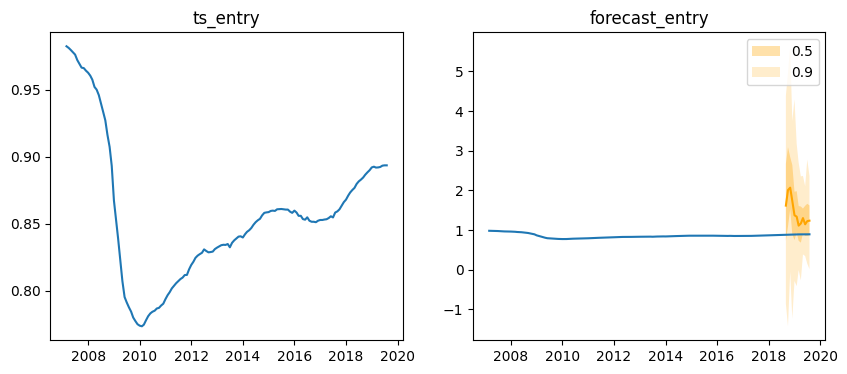

Number of sample paths: 100
Dimension of samples: (100, 12)
Start date of the forecast window: 2018-09
Frequency of the time series: <MonthEnd>
Mean of the future window:
 [-0.5895932  1.4245993  2.0551357  1.4692339  1.4051584  1.3985285
  1.1632738  1.0093037  1.1330005  1.120413   1.1565595  1.0972375]
0.5-quantile (median) of the future window:
 [1.405393   1.6724396  2.0541737  1.6931832  1.1720474  1.224601
 0.9804829  0.9611787  0.95619476 1.0453115  1.1522694  1.036118  ]


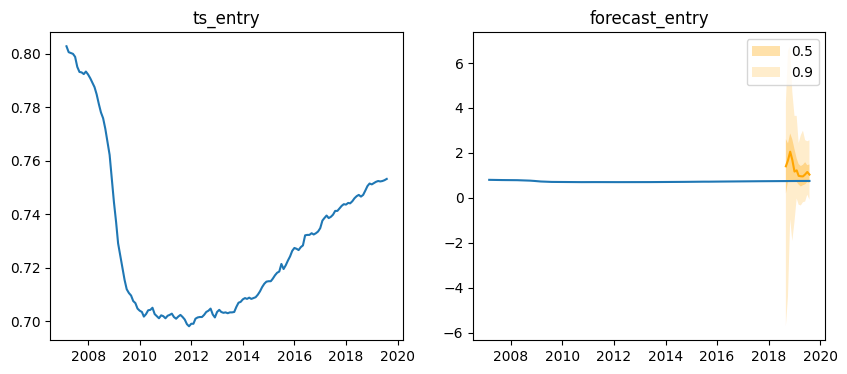

Number of sample paths: 100
Dimension of samples: (100, 12)
Start date of the forecast window: 2018-09
Frequency of the time series: <MonthEnd>
Mean of the future window:
 [4.1858854 4.785322  4.689465  4.4378066 3.923851  3.642948  3.7731278
 3.8213112 3.8714502 3.8529181 3.8242002 3.814705 ]
0.5-quantile (median) of the future window:
 [4.4277773 5.0342402 4.6695557 4.341303  3.9301379 3.7071276 3.7329762
 3.828125  3.8810506 3.863357  3.8098931 3.8158581]


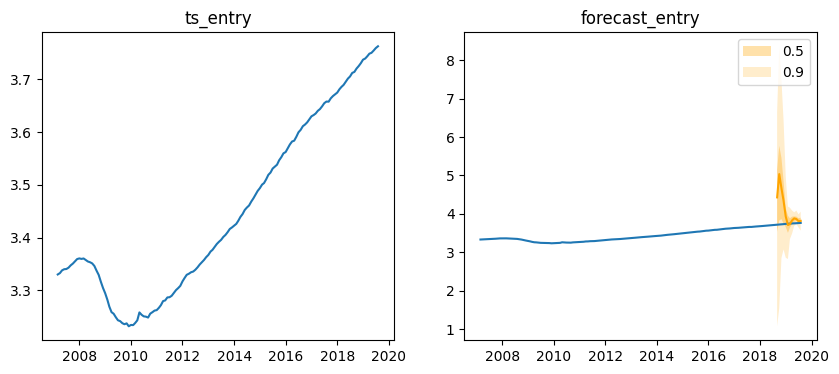

Number of sample paths: 100
Dimension of samples: (100, 12)
Start date of the forecast window: 2018-09
Frequency of the time series: <MonthEnd>
Mean of the future window:
 [3.4335432 3.8509285 3.6422112 3.1393716 2.9286773 2.5439003 2.5630245
 2.554014  2.595601  2.5458992 2.5813086 2.5404024]
0.5-quantile (median) of the future window:
 [3.5266333 3.447043  3.6254349 3.1576939 2.9398715 2.516831  2.549469
 2.5693674 2.583522  2.5822906 2.5747986 2.52535  ]


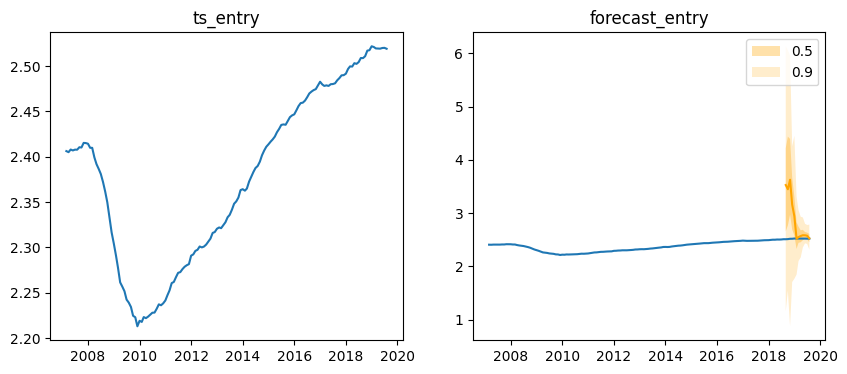

Number of sample paths: 100
Dimension of samples: (100, 12)
Start date of the forecast window: 2018-09
Frequency of the time series: <MonthEnd>
Mean of the future window:
 [3.0647495 3.2427568 3.129165  3.0236063 2.7217927 2.2779899 2.2774076
 2.3057494 2.2702904 2.302793  2.2677505 2.2305977]
0.5-quantile (median) of the future window:
 [2.8279932 3.245327  3.2360237 3.0619187 2.6632574 2.2806175 2.2606833
 2.3060737 2.2594752 2.288691  2.2630036 2.2367558]


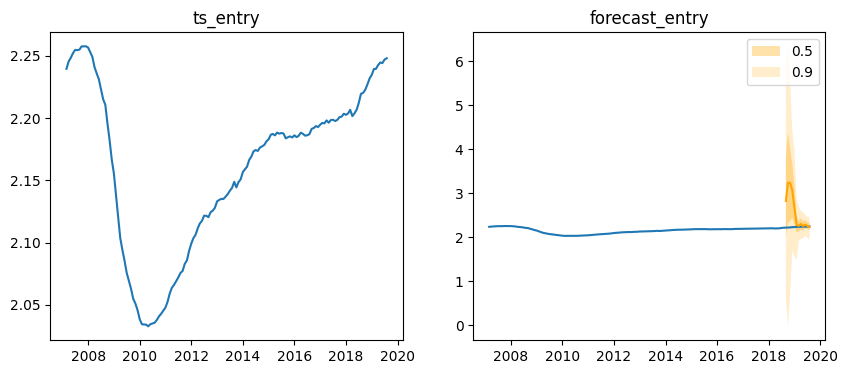

Number of sample paths: 100
Dimension of samples: (100, 12)
Start date of the forecast window: 2018-09
Frequency of the time series: <MonthEnd>
Mean of the future window:
 [3.0710406 4.258711  3.9063458 3.6194582 3.4186797 3.0611129 2.9613454
 2.951384  2.9485445 2.9196966 2.9449809 2.9162893]
0.5-quantile (median) of the future window:
 [3.311426  4.372721  3.9299784 3.535118  3.326101  3.0660806 2.9576828
 2.9391093 2.9475632 2.9227781 2.9377458 2.9243257]


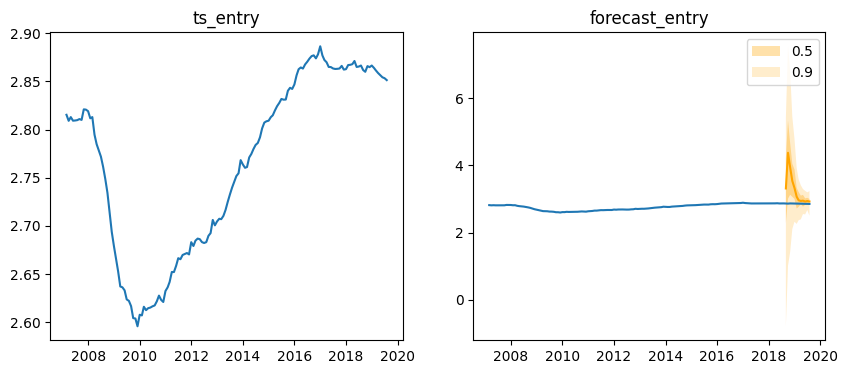

Number of sample paths: 100
Dimension of samples: (100, 12)
Start date of the forecast window: 2018-09
Frequency of the time series: <MonthEnd>
Mean of the future window:
 [4.1147017 4.3374233 4.693208  4.0708075 3.8149042 3.5138898 3.485977
 3.573352  3.6018379 3.4890165 3.5218382 3.5210302]
0.5-quantile (median) of the future window:
 [4.3087964 4.312613  4.564957  3.9520679 3.7732358 3.3257542 3.5303032
 3.5509562 3.6086671 3.50947   3.5064461 3.5362446]


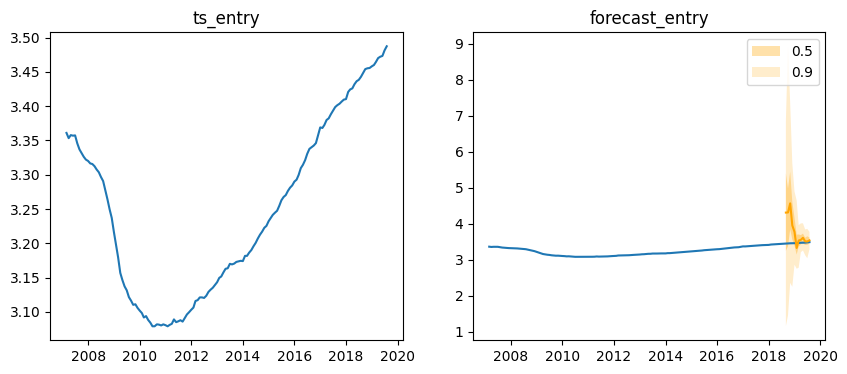

Number of sample paths: 100
Dimension of samples: (100, 12)
Start date of the forecast window: 2018-09
Frequency of the time series: <MonthEnd>
Mean of the future window:
 [3.0706756 3.761264  3.5245216 3.6952243 3.119718  2.9463143 2.8762515
 2.7888355 2.7759128 2.7764666 2.7162914 2.7506466]
0.5-quantile (median) of the future window:
 [3.3316283 3.7102861 3.5611002 3.4053605 3.159657  2.8945293 2.869165
 2.816409  2.7820895 2.790719  2.6965253 2.7632563]


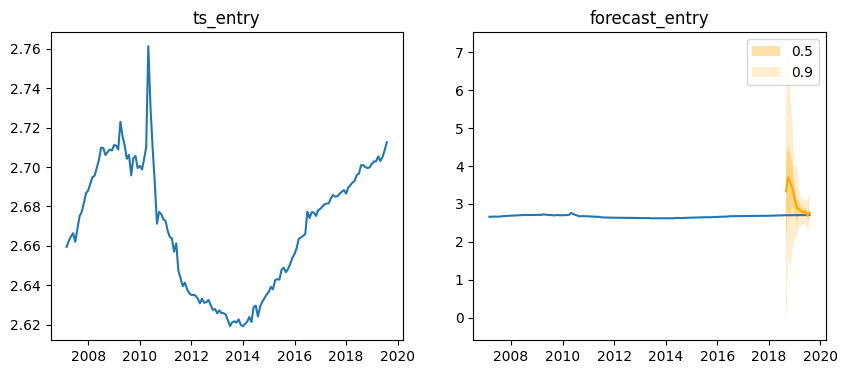

Number of sample paths: 100
Dimension of samples: (100, 12)
Start date of the forecast window: 2018-09
Frequency of the time series: <MonthEnd>
Mean of the future window:
 [1.9716496 2.1530917 1.4360126 2.1269891 1.6108934 1.5800247 1.1053903
 1.3817873 1.1776798 1.5251163 1.2552699 1.565161 ]
0.5-quantile (median) of the future window:
 [2.0937042 1.9233941 1.9141495 1.8421419 1.5492375 1.5298481 1.1755955
 1.3312829 1.1787937 1.3458315 1.2426212 1.3948411]


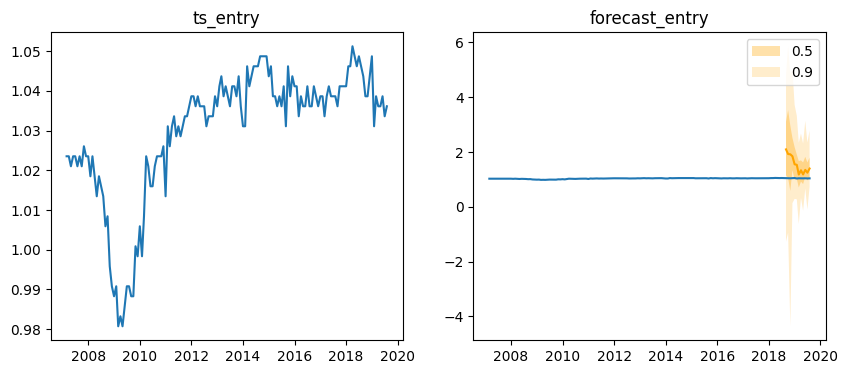

Number of sample paths: 100
Dimension of samples: (100, 12)
Start date of the forecast window: 2018-09
Frequency of the time series: <MonthEnd>
Mean of the future window:
 [2.5802634 2.2640793 2.6431653 2.8231368 2.3324325 2.0561502 1.7540332
 2.013942  1.6759841 1.8319473 1.8627312 1.9728452]
0.5-quantile (median) of the future window:
 [2.4192996 2.5157588 2.6890829 2.5841603 2.3085294 2.1043952 1.804844
 1.9180164 1.7856086 1.7911309 1.7723615 1.9425457]


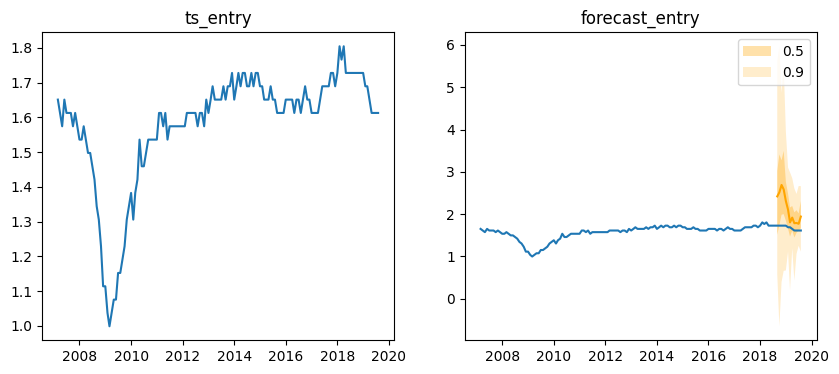

Number of sample paths: 100
Dimension of samples: (100, 12)
Start date of the forecast window: 2018-09
Frequency of the time series: <MonthEnd>
Mean of the future window:
 [1.9033151 1.8282905 2.5256398 2.2410667 1.8439467 1.3575428 1.5494038
 1.2644277 1.2868985 1.1700485 1.4682326 1.3896234]
0.5-quantile (median) of the future window:
 [2.0367785 1.7857223 2.196543  1.8959962 1.712878  1.4715513 1.40112
 1.2650003 1.347956  1.2831762 1.3408567 1.4053226]


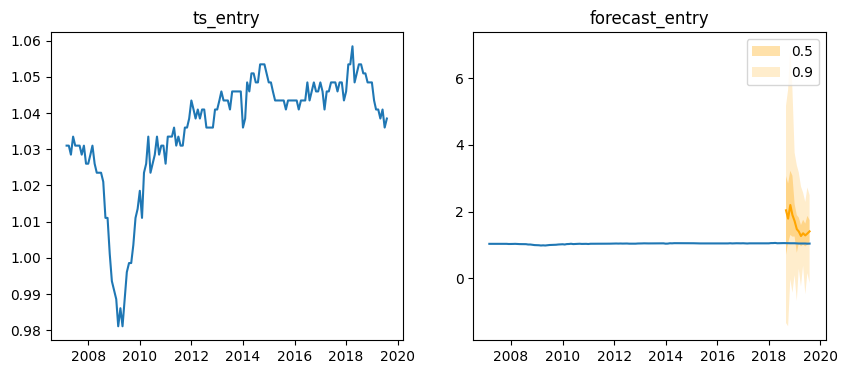

Number of sample paths: 100
Dimension of samples: (100, 12)
Start date of the forecast window: 2018-09
Frequency of the time series: <MonthEnd>
Mean of the future window:
 [1.9089088 2.0187445 1.8071524 1.6636869 1.7260432 1.5430119 1.1564274
 1.368101  1.1757364 1.0360202 1.3974202 0.9921634]
0.5-quantile (median) of the future window:
 [1.2595044 2.1635947 1.9733732 1.5979615 1.5834055 1.3792218 1.158177
 1.1838732 1.073002  1.093676  1.1278951 1.1105063]


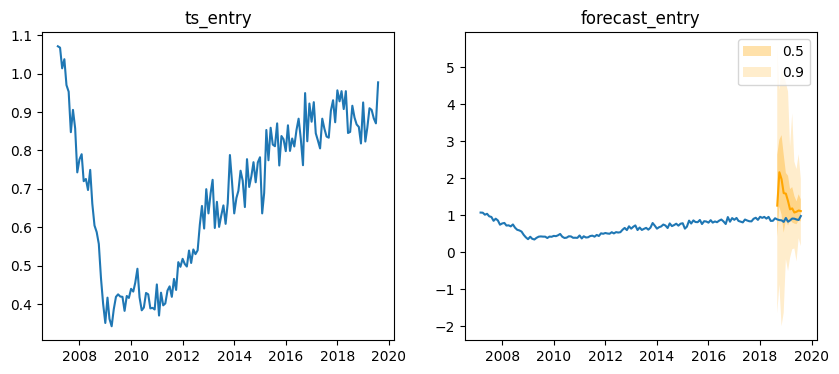

Number of sample paths: 100
Dimension of samples: (100, 12)
Start date of the forecast window: 2018-09
Frequency of the time series: <MonthEnd>
Mean of the future window:
 [1.3864529  1.0923709  1.8838305  1.2181714  1.0807042  0.81514436
 0.8574534  0.8907367  0.9208191  0.6880087  0.8358659  0.86795294]
0.5-quantile (median) of the future window:
 [1.4422941  1.4309387  1.7798874  1.2314045  1.1018559  0.6427827
 0.74928397 0.76557523 0.7769246  0.6927474  0.74797225 0.8425902 ]


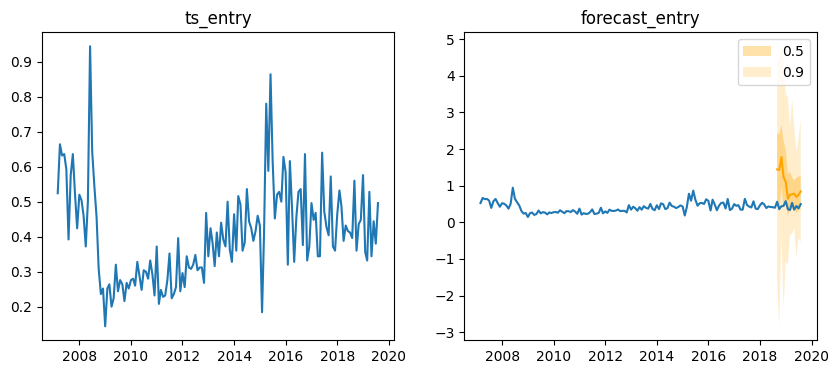

Number of sample paths: 100
Dimension of samples: (100, 12)
Start date of the forecast window: 2018-09
Frequency of the time series: <MonthEnd>
Mean of the future window:
 [1.7436696  1.9325073  1.4644828  1.373456   0.9098091  1.1100403
 1.2494588  0.88706857 0.9964915  1.0096408  1.1710941  1.2734001 ]
0.5-quantile (median) of the future window:
 [1.6749765  1.7217139  1.4959228  1.3681529  1.0527246  1.0536816
 1.1004939  0.9915471  0.86408466 0.8925595  0.9314188  1.0485862 ]


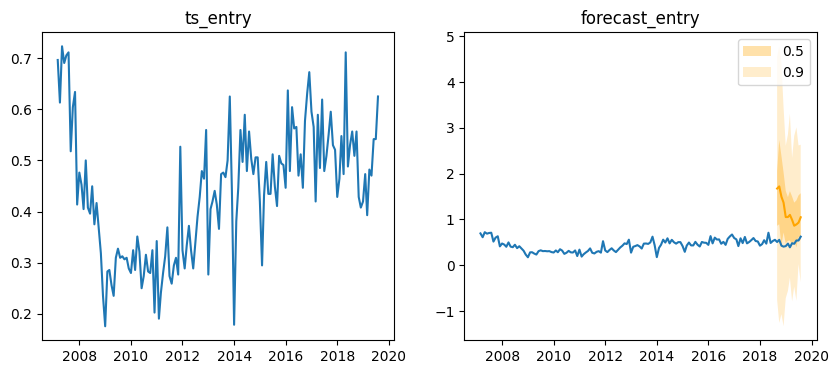

Number of sample paths: 100
Dimension of samples: (100, 12)
Start date of the forecast window: 2018-09
Frequency of the time series: <MonthEnd>
Mean of the future window:
 [2.2955675 2.2735376 2.1183326 1.8579408 1.7455102 1.5504348 1.6568657
 1.6379167 1.5454177 1.5131336 1.4277949 1.6369689]
0.5-quantile (median) of the future window:
 [2.152116  2.0161242 2.3722284 2.036935  1.7666228 1.6288443 1.6695348
 1.589456  1.4363011 1.4598212 1.4145907 1.5934577]


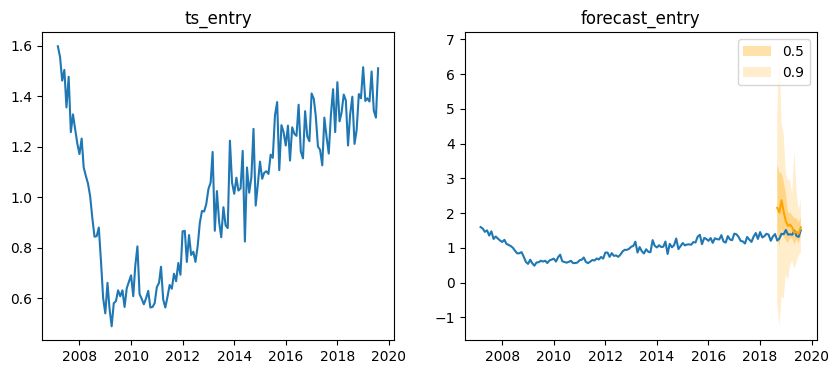

Number of sample paths: 100
Dimension of samples: (100, 12)
Start date of the forecast window: 2018-09
Frequency of the time series: <MonthEnd>
Mean of the future window:
 [1.2745479 1.7433048 2.2959144 1.8210489 1.7295552 1.293445  1.4444909
 1.1738307 1.3869278 1.1057589 1.1314195 1.2439305]
0.5-quantile (median) of the future window:
 [1.6698813 1.9608299 2.195068  1.9071938 1.6359746 1.1937821 1.2996737
 1.2387241 1.1992155 1.094175  1.1813805 1.148208 ]


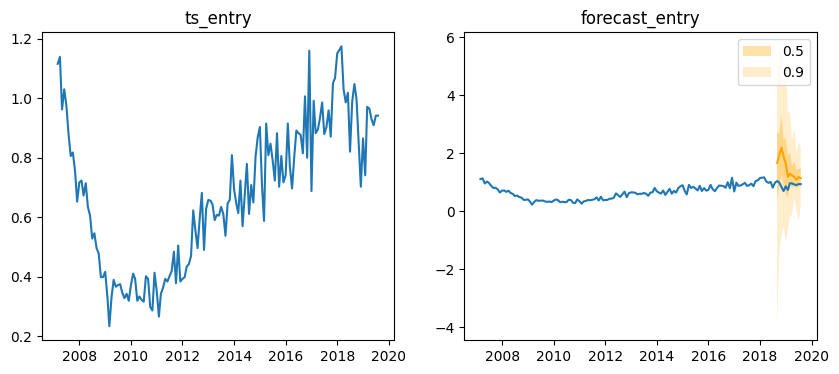

Number of sample paths: 100
Dimension of samples: (100, 12)
Start date of the forecast window: 2018-09
Frequency of the time series: <MonthEnd>
Mean of the future window:
 [17.238413 17.401    17.462666 17.26251  17.432829 17.15029  17.197454
 17.690428 17.467995 17.613068 17.617296 17.553644]
0.5-quantile (median) of the future window:
 [16.95002  17.374407 17.577702 17.356644 17.556522 17.163807 17.186737
 17.569397 17.408735 17.502407 17.52     17.669617]


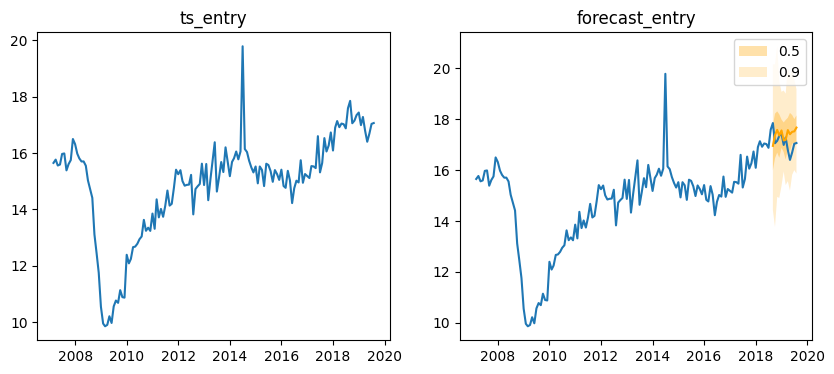

In [62]:
for ts_index in range(min(50, len(test_dataset))):
    ts_entry = tss[ts_index]
    dataset_test_entry = test_dataset[ts_index]
    forecast_entry = forecasts[ts_index]
    
    print(f"Number of sample paths: {forecast_entry.num_samples}")
    print(f"Dimension of samples: {forecast_entry.samples.shape}")
    print(f"Start date of the forecast window: {forecast_entry.start_date}")
    print(f"Frequency of the time series: {forecast_entry.freq}")

    print(f"Mean of the future window:\n {forecast_entry.mean}")
    print(f"0.5-quantile (median) of the future window:\n {forecast_entry.quantile(0.5)}")

    fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(10, 4)) 

    axs[0].plot(ts_entry[-150:].to_timestamp()) 
    axs[0].set_title('ts_entry')

    axs[1].plot(ts_entry[-150:].to_timestamp())  
    forecast_entry.plot(show_label=True, color="orange", ax=axs[1]) 
    axs[1].set_title('forecast_entry')
    axs[1].legend()
    
    plt.show()